# Project M2: Audio classification
Goal of this project is to gain first experiences in audio classification with neural networks.

Build different models to classify audio data for two different classification tasks:
1) AudioMNIST dataset   
2) ESC-50 dataset

In [1]:
from pathlib import Path
import os
from scipy.io import wavfile as wavf
from scipy import fft
import scipy
from IPython.display import Audio
import json
import pandas as pd
from matplotlib import pyplot as plt
import librosa, librosa.display
import numpy as np
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')
import tensorflow as tf
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from tensorflow.keras.layers import Dense, Flatten, Conv2D, Dropout, MaxPool2D, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from audiomentations import Compose, AddGaussianNoise, TimeStretch, PitchShift, Shift, Gain

## 1. AudioMNIST

First models are built on <b>AudioMNIST</b> dataset. As per the author of following paper, this dataset can be used as a benchmark for sound classification models.

Paper: https://arxiv.org/pdf/1807.03418.pdf  
Original Dataset: https://github.com/soerenab/AudioMNIST  

Two main approaches in model building process are considered: (1) Using CNN architectures on spectrogram representation and (2) Using RNN/LSTM architectures on waveform representation

Brief description of data:
- 60 different speakers
- Every speaker speaks number 0 to 9, each number 50 times
- All Audios have sampling frequency of 48kHz and were saved in 16 bit integer format
- Audio files can be found with following pattern: '{speakerid/{number}_{speakerid}_{sampleid}.wav', e.g. Speaker 1, Number 0, Sample 1: '01/00_01_0'
- audioMNIST_meta.txt contains information on accent, age, gender, native speaker flag, origin and recording date

### 1.1. Preliminary EDA

In [171]:
source_path = Path('../AudioMNIST/data')
metadata_path = os.path.join('../AudioMNIST/audioMNIST_meta.txt')

In [172]:
# Load metadata
metadata = metaData = json.load(open(metadata_path))
metadata_df = pd.DataFrame.from_dict(metadata, orient='index')
metadata_df.head()

,accent,age,gender,native speaker,origin,recordingdate,recordingroom
01,german,30,male,no,"Europe, Germany, Wuerzburg",17-06-22-11-04-28,Kino
02,German,25,male,no,"Europe, Germany, Hamburg",17-06-26-17-57-29,Kino
03,German,31,male,no,"Europe, Germany, Bremen",17-06-30-17-34-51,Kino
04,German,23,male,no,"Europe, Germany, Helmstedt",17-06-30-18-09-14,Kino
05,German,25,male,no,"Europe, Germany, Hameln",17-07-06-10-53-10,Kino


In [173]:
example_path = os.path.join(source_path, '01/0_01_0.wav')

signal, sr = librosa.load(example_path, sr=None) # sr=None; load file with original sampling rate
sr = librosa.get_samplerate(example_path)
print('Sampling rate: ', sr)
duration = librosa.get_duration(signal, sr=sr)
print('Duration: ', duration)

Sampling rate:  48000
Duration:  0.7474375


In [174]:
sr, signal.shape

(48000, (35877,))

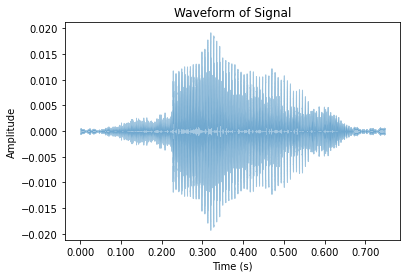

In [175]:
# Librosa gives normalized amplitude of input data, scipy wavefile does not: https://stackoverflow.com/questions/50062358/difference-between-load-of-librosa-and-read-of-scipy-io-wavfile

'''
Waveform visualization is called the time-domain representation of a given signal. 
Shows loudness (amplitude) of sound wave changing with time. 
Amplitude = 0 = silence
'''

librosa.display.waveshow(signal, sr=sr, alpha=0.4)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Waveform of Signal')
plt.show()

In [176]:
signal

array([0.00045776, 0.00042725, 0.00045776, ..., 0.0005188 , 0.0005188 ,
       0.0005188 ], dtype=float32)

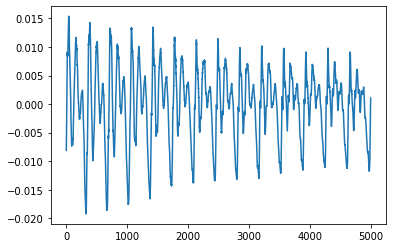

In [177]:
plt.plot(signal[15000:20000])

In [178]:
Audio(signal, rate=sr)

In [179]:
# Check signal length distribution over all files
raw_data = []

for speaker in tqdm(os.listdir(source_path)):
          
    speaker_path = os.path.join(source_path, speaker)

    for file in os.listdir(speaker_path):

        file_path = os.path.join(speaker_path, file)
        digit = file[:1]
        repetition = int(file.strip('.wav').split('_')[2])
        signal, sr = librosa.load(file_path, sr=None) # None = Use original SR
        
        raw_data.append({
            'speaker': speaker,
            'digit': digit,
            'repetition': repetition,
            'file': file,
            'signal': signal,
            'signal_length': len(signal),
            'org_sampling_rate': sr
        })
        
        
raw_data_df = pd.DataFrame(raw_data).sort_values(by=['speaker', 'digit', 'repetition'])
raw_data_df.head()

100%|██████████| 60/60 [00:29<00:00,  2.05it/s]


,speaker,digit,repetition,file,signal,signal_length,org_sampling_rate
0,01,0,0,0_01_0.wav,"[0.00045776367, 0.0004272461, 0.00045776367, 0...",35877,48000
1,01,0,1,0_01_1.wav,"[6.1035156e-05, 6.1035156e-05, 6.1035156e-05, ...",31356,48000
12,01,0,2,0_01_2.wav,"[-0.00088500977, -0.00088500977, -0.0008850097...",37103,48000
23,01,0,3,0_01_3.wav,"[9.1552734e-05, 6.1035156e-05, 9.1552734e-05, ...",39389,48000
34,01,0,4,0_01_4.wav,"[0.00076293945, 0.00076293945, 0.00076293945, ...",29544,48000


In [180]:
# All signals are below 1 second, i.e. signal_length < org_sampling_rate
# All signals are with org_sampling_rate of 48kHz
raw_data_df.describe()

,repetition,signal_length,org_sampling_rate
count,30000.00000,30000.000000,30000.0
mean,24.50000,30844.475533,48000.0
std,14.43111,5334.715104,0.0
min,0.00000,14073.000000,48000.0
25%,12.00000,26909.750000,48000.0
50%,24.50000,30336.000000,48000.0
75%,37.00000,34380.000000,48000.0
max,49.00000,47998.000000,48000.0


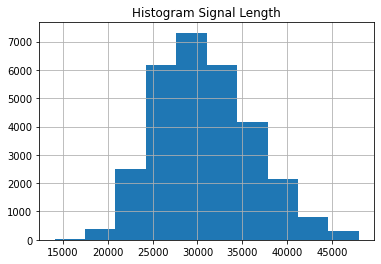

In [181]:
# Histogram of Signal length -> we have to adjust all signals to same length later in preprocessing
raw_data_df['signal_length'].hist()
plt.title('Histogram Signal Length')
plt.show()

### 1.2. Playing around with STFT, Spectrograms and MFCC

Basic theory of audio:  
https://dropsofai.com/sound-wave-basics-every-data-scientist-must-know-before-starting-analysis-on-audio-data/

FFT:
https://www.nti-audio.com/en/support/know-how/fast-fourier-transform-fft#:~:text=The%20sampling%20rate%20or%20sampling,2%5E10%20%3D%201024%20samples)

Background and theory STFT and Spectrograms:  
https://towardsdatascience.com/understanding-audio-data-fourier-transform-fft-spectrogram-and-speech-recognition-a4072d228520
https://medium.com/analytics-vidhya/simplifying-audio-data-fft-stft-mfcc-for-machine-learning-and-deep-learning-443a2f962e0e

MFCC:  
The Mel frequency cepstral coefficients (MFCCs) of a signal are a small set of features (usually about 10–20) which concisely describe the overall shape of a spectral envelope. It models the characteristics of the human voice.
https://www.kdnuggets.com/2020/02/audio-data-analysis-deep-learning-python-part-1.html
https://medium.com/analytics-vidhya/simplifying-audio-data-fft-stft-mfcc-for-machine-learning-and-deep-learning-443a2f962e0e

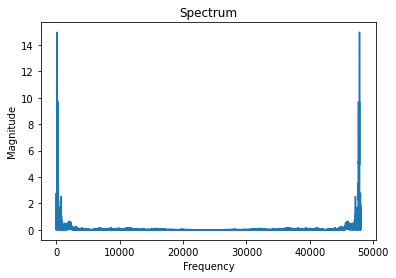

In [182]:
# Simple FFT

# calculate abs values on complex numbers to get magnitude
fft = np.fft.fft(signal)
spectrum = np.abs(fft)

# create frequency variable
f = np.linspace(0, sr, len(spectrum))

# take half of the spectrum and frequency
#left_spectrum = spectrum[:int(len(spectrum)/2)]
#left_f = f[:int(len(spectrum)/2)]

# plot full spectrum
plt.figure()
plt.plot(f, spectrum)
plt.xlabel('Frequency')
plt.ylabel('Magnitude')
plt.title('Spectrum')
plt.show()

Text(0, 0.5, 'Amplitude')

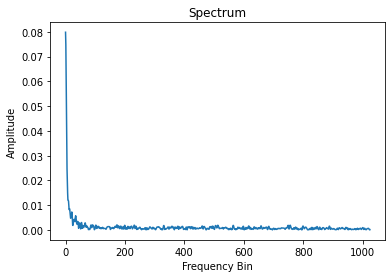

In [183]:
# Plot of signal in frequency dimension with STFT
# See https://www.tutorialexample.com/understand-n_fft-hop_length-win_length-in-audio-processing-librosa-tutorial/
# FFT alone is not useful, since we capture the whole time series in frequency domain and loss time information, so we neede STFT

n_fft = 512 # frame size recommended for speach...
ft = np.abs(librosa.stft(signal[:n_fft], hop_length=n_fft+1)) # No overlapping in this plot
plt.plot(ft)
plt.title('Spectrum')
plt.xlabel('Frequency Bin')
plt.ylabel('Amplitude')

#### Notes Spectrogram and STFT:
- Higher n_fft (i.e. number of frequency bins) = higher frequency resolution (more frequency bins)
- Smaller hop_length = higher time resolution
- See: https://music-classification.github.io/tutorial/part2_basics/input-representations.html
- Shape is ((1 + n_fft) / 2, number of samples).... n_fft defines how the frequency space is divided, i.e. how many frequency bins are created... we only see half of the bins, since FFT is symmetrical, see: https://ch.mathworks.com/matlabcentral/answers/322142-what-are-frequency-bins
- Maximum frequency captured by fft is sr / 2, see: https://www.nti-audio.com/en/support/know-how/fast-fourier-transform-fft#:~:text=The%20sampling%20rate%20or%20sampling,2%5E10%20%3D%201024%20samples)
- 512 recommended for speech (see librosa page)... 
- when hop_length = n_fft, then we have no overlap
- Amplitude to DB applies a Log and DB is always relativ... in spectorgram highest DB is 0

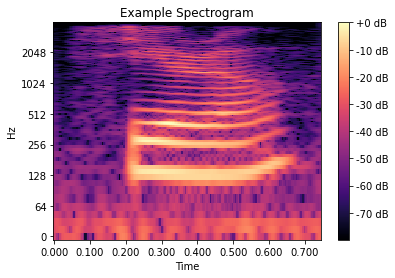

Shape:  (257, 171)


In [184]:
# Example Normal Spectrogram
signal, sr = librosa.load(example_path, sr=8000) 

stft = np.abs(librosa.stft(signal, n_fft=512, hop_length=35)) 
stft_db = librosa.amplitude_to_db(stft)

librosa.display.specshow(stft_db, y_axis='log', x_axis='time', sr=sr, hop_length=35) 
plt.title('Example Spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.show()

print('Shape: ', stft_db.shape)

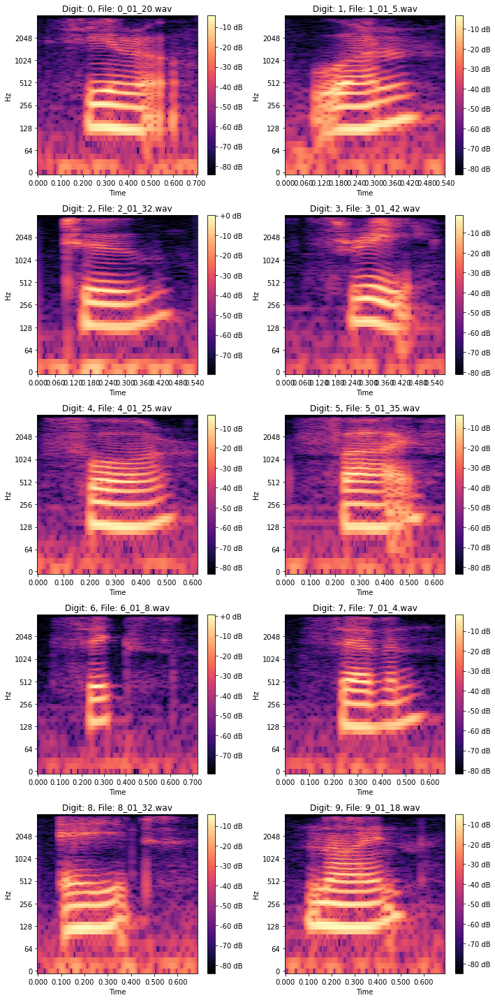

In [185]:
# Create spectrogram plots for example files for digit 0 to 9
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(10, 20))

digits = [i for i in range(10)] # Digit 0 to 9

# loop through digits and axes
for digit, ax in zip(digits, axs.ravel()):
    
    # Load file from speaker 1
    rep = np.random.randint(0,49) # Random repetition    
    file = f'{digit}_01_{rep}.wav'
    example_path = os.path.join(source_path, f'01/{file}')
    signal, sr = librosa.load(example_path, sr=8000) 
    
    # Create spectrogram
    stft = np.abs(librosa.stft(signal, n_fft=512, hop_length=35))
    stft_db = librosa.amplitude_to_db(stft)
    
    # Display spectrogram
    img = librosa.display.specshow(stft_db, y_axis='log', x_axis='time', ax=ax, sr=sr, hop_length=35)
    
    # Format plot
    ax.set_title(f'Digit: {digit}, File: {file}')
    fig.colorbar(img, ax=ax, format='%+2.0f dB')

fig.tight_layout()
plt.show()

#### Notes Mel Spectrogram:
- Power to DB instead amplitude to DB
- Default n_mels is 128
- Shape is n_mels in rows, time in columns
- More bins more frequency resolution

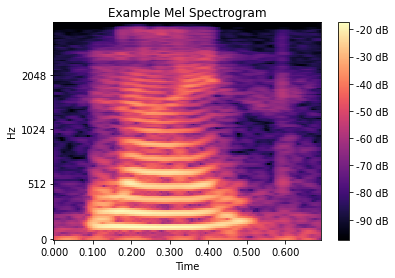

Shape:  (128, 159)


In [186]:
# Example Mel spectrogram
mel = librosa.feature.melspectrogram(signal, sr=sr, n_fft=512, hop_length=35)
mel_db = librosa.power_to_db(mel)

librosa.display.specshow(mel_db, sr=sr, x_axis='time', y_axis='mel', hop_length=35)
plt.title('Example Mel Spectrogram')
plt.colorbar(format='%+2.0f dB')
plt.show()

print('Shape: ', mel_db.shape)

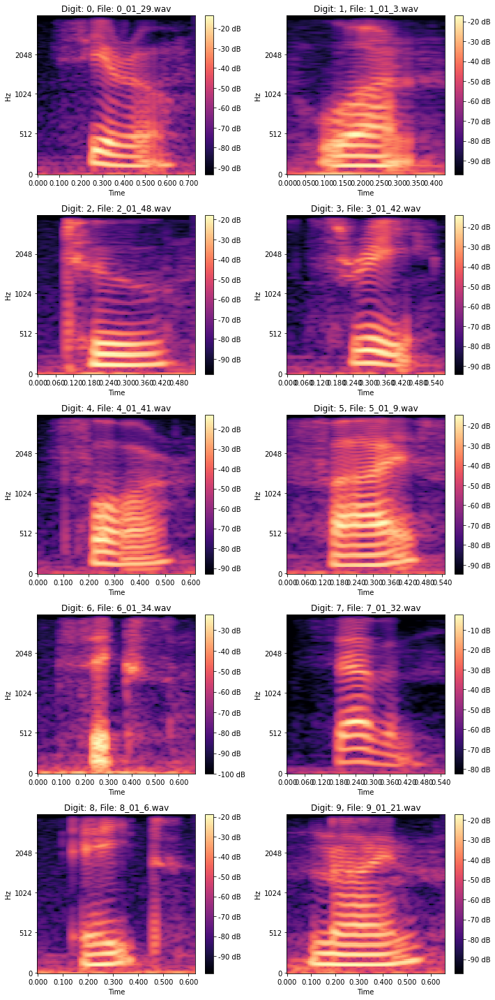

In [187]:
# Create Mel spectrogram plots for example files for digit 0 to 9
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(10, 20))

digits = [i for i in range(10)] # Digit 0 to 9

# loop through digits and axes
for digit, ax in zip(digits, axs.ravel()):
    
    # Load file from speaker 1
    rep = np.random.randint(0,49) # Random repetition    
    file = f'{digit}_01_{rep}.wav'
    example_path = os.path.join(source_path, f'01/{file}')
    signal, sr = librosa.load(example_path, sr=8000) 

    # Create Mel spectrogram
    mel = librosa.feature.melspectrogram(signal, sr=sr, n_fft=512, hop_length=35)
    mel_db = librosa.power_to_db(mel)
    
    # Display spectrogram
    img = librosa.display.specshow(mel_db, x_axis='time', y_axis='mel', ax=ax, sr=sr, hop_length=35)
    
    # Format plot
    ax.set_title(f'Digit: {digit}, File: {file}')
    fig.colorbar(img, ax=ax, format='%+2.0f dB')

fig.tight_layout()
plt.show()

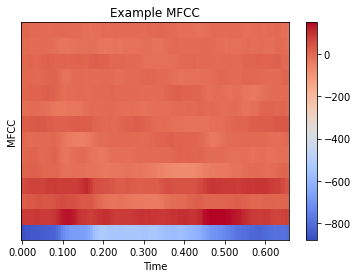

In [188]:
# Example MFCC
mfcc = librosa.feature.mfcc(signal, sr=sr, n_fft=512, hop_length=35, n_mfcc=14)
librosa.display.specshow(mfcc, sr=sr, hop_length=35, x_axis='time')

plt.title('Example MFCC')
plt.xlabel('Time')
plt.ylabel('MFCC')
plt.colorbar()
plt.show()

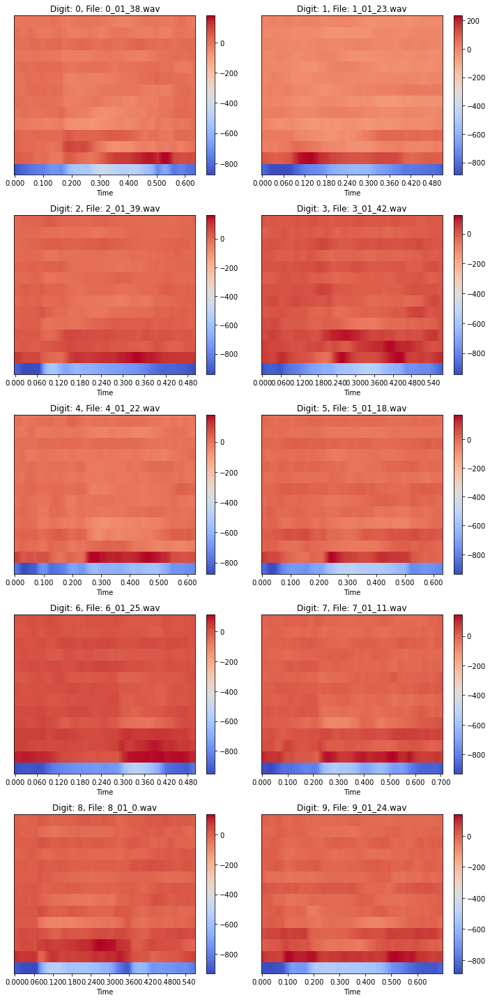

In [189]:
# Create MFCC plots for example files for digit 0 to 9
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(10, 20))

digits = [i for i in range(10)] # Digit 0 to 9

# loop through digits and axes
for digit, ax in zip(digits, axs.ravel()):
    
    # Load file from speaker 1
    rep = np.random.randint(0,49) # Random repetition    
    file = f'{digit}_01_{rep}.wav'
    example_path = os.path.join(source_path, f'01/{file}')
    signal, sr = librosa.load(example_path, sr=8000) 

    # Create MFCC
    mfcc = librosa.feature.mfcc(signal, sr=sr, n_fft=512, hop_length=35, n_mfcc=14)
    
    # Display MFCC
    img = librosa.display.specshow(mfcc, sr=sr, hop_length=35, ax=ax, x_axis='time')
    
    # Format plot
    ax.set_title(f'Digit: {digit}, File: {file}')
    fig.colorbar(img, ax=ax)

fig.tight_layout()
plt.show()

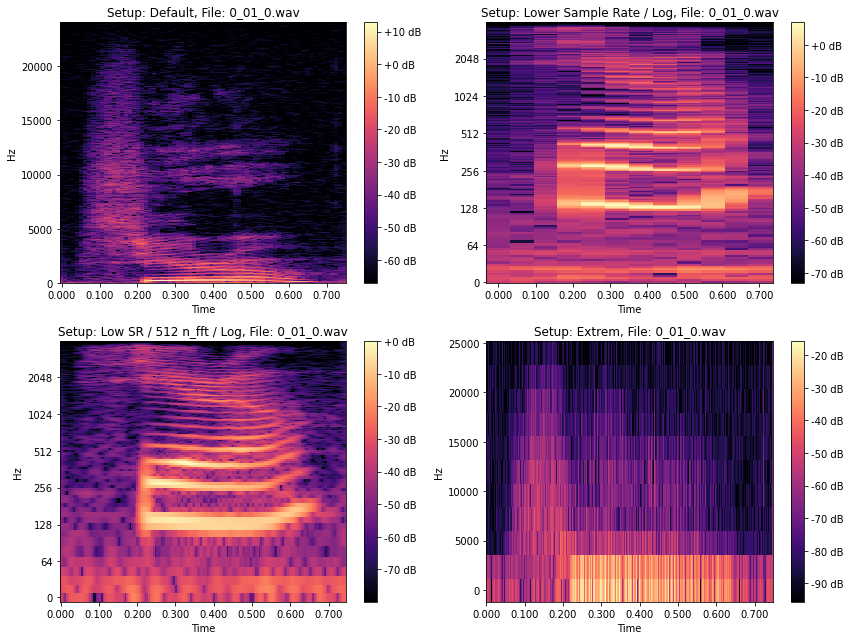

In [190]:
# Show how different spectrograms can look like
setups = [
    {
        'setup': 'Default', 
        'sr': 48000, 
        'n_fft': 2048, 
        'hop_length': 512, 
        'win_length': 2048, 
        'scale': 'linear'
    }, 
    {
        'setup': 'Lower Sample Rate / Log', 
        'sr': 8000, 
        'n_fft': 2048, 
        'hop_length': 512, 
        'win_length': 2048, 
        'scale': 'log'
    }, 
    {
        'setup': 'Low SR / 512 n_fft / Log', 
        'sr': 8000, 
        'n_fft': 512, 
        'hop_length': 35, 
        'win_length': 512, 
        'scale': 'log'
    }, 
    {
        'setup': 'Extrem', 
        'sr': 48000, 
        'n_fft': 20, 
        'hop_length': 35, 
        'win_length': 10, 
        'scale': 'linear'
    }
]

# Create spectrogram plots for example files for digit 0 to 9
file = '0_01_0.wav'
example_path = os.path.join(source_path, f'01/{file}')

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 9))

# loop through setups and axes
for setup, ax in zip(setups, axs.ravel()):
    
    setup_name = setup['setup']
    
    # Load example file
    signal, sr = librosa.load(example_path, sr=setup['sr']) 
    
    # Create spectrogram
    stft = np.abs(librosa.stft(signal, n_fft=setup['n_fft'], hop_length=setup['hop_length']))
    stft_db = librosa.amplitude_to_db(stft)
    
    # Display spectrogram
    img = librosa.display.specshow(stft_db, y_axis=setup['scale'], x_axis='time', ax=ax, sr=setup['sr'], hop_length=setup['hop_length'])
    
    # Format plot
    ax.set_title(f'Setup: {setup_name}, File: {file}')
    fig.colorbar(img, ax=ax, format='%+2.0f dB')

fig.tight_layout()
plt.show()

### 1.3. Preprocessing

- Reduce data points with resampling to 8000 Hz
- Bring all files to same length, zero padding both ends
- Create spectrograms with Short Time Fourier Transform (STFT)
- Create Mel Spectrograms
- Create Mel-Frequency Cepstral Coefficients (MFCC)

In [191]:
n_fft = 512
hop_length = 35
n_mfcc = 14

In [192]:
# Load with sr = 8000
signal, sr = librosa.load(example_path, sr=8000) # Default sr
signal.shape

(5980,)

In [193]:
# Padding signal front/back with zeros to 8000
n_zeros = sr - len(signal)
n_zeros_front = int(n_zeros*.5)
n_zeros_back = n_zeros - n_zeros_front
signal_padded = np.pad(signal, (n_zeros_front, n_zeros_back))
signal_padded.shape

(8000,)

In [194]:
# Perform stft and convert to db
stft = np.abs(librosa.stft(signal_padded, n_fft=n_fft, hop_length=hop_length))
stft_db = librosa.amplitude_to_db(stft, ref=np.max)
stft_db.shape

(257, 229)

In [195]:
# Mel Spectrogram
mel = librosa.feature.melspectrogram(signal_padded, sr=sr, n_fft=n_fft, hop_length=hop_length)
mel_db = librosa.power_to_db(mel)
mel_db.shape

(128, 229)

In [196]:
# MFCC
mfcc = librosa.feature.mfcc(signal_padded, n_fft=n_fft, n_mfcc=n_mfcc, hop_length=hop_length)
mfcc.shape

(14, 229)

In [197]:
# Loop through speaker folders and create spectrogram data... we don't need to draw and save images
# Input to Neural Network are not the images, but the spectrogram data
# see https://towardsdatascience.com/audio-deep-learning-made-simple-sound-classification-step-by-step-cebc936bbe5
preprocessed_data = []

for speaker in tqdm(os.listdir(source_path)):
          
    speaker_path = os.path.join(source_path, speaker)

    for file in os.listdir(speaker_path):
        
        # Load file
        file_path = os.path.join(speaker_path, file)
        signal, sr = librosa.load(file_path, sr=8000) # Default sr
        
        # Padding signal
        n_zeros = sr - len(signal)
        n_zeros_front = int(n_zeros*.5)
        n_zeros_back = n_zeros - n_zeros_front
        signal_padded = np.pad(signal, (n_zeros_front, n_zeros_back))
        
        # Create STFT spectrogram and convert to db scale
        stft = np.abs(librosa.stft(signal_padded, n_fft=n_fft, hop_length=hop_length))
        stft_db = librosa.amplitude_to_db(stft, ref=np.max)
        stft_db = stft_db.reshape(1, stft_db.shape[0], stft_db.shape[1])
        
        # Create Mel Spectrogram and convert to db scale
        mel = librosa.feature.melspectrogram(signal_padded, sr=sr, n_fft=n_fft, hop_length=hop_length)
        mel_db = librosa.power_to_db(mel)
        mel_db = mel_db.reshape(1, mel_db.shape[0], mel_db.shape[1])
        
        # Extract MFCCs
        mfcc = librosa.feature.mfcc(signal_padded, sr=sr, n_fft=n_fft, n_mfcc=n_mfcc, hop_length=hop_length)
        mfcc = mfcc.reshape(1, mfcc.shape[0], mfcc.shape[1])
         
        # Get label and repetition
        digit = file[:1]
        repetition = int(file.strip('.wav').split('_')[2])
        
        preprocessed_data.append({
            'speaker': speaker,
            'digit': digit,
            'repetition': repetition,
            'file': file,
            'signal_padded': signal_padded,
            'stft_db': stft_db,
            'mel_db': mel_db,
            'mfcc': mfcc
        })
        
preprocessed_data_df = pd.DataFrame(preprocessed_data)
preprocessed_data_df.head()

100%|██████████| 60/60 [29:19<00:00, 29.33s/it]


,speaker,digit,repetition,file,signal_padded,stft_db,mel_db,mfcc
0,01,0,0,0_01_0.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-92.53915, -92.53915, -92.53915, -92.53915,...","[[[-1046.9609, -1046.9609, -1046.9609, -1046.9..."
1,01,0,1,0_01_1.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-97.5652, -97.5652, -97.5652, -97.5652, -97...","[[[-1103.8242, -1103.8242, -1103.8242, -1103.8..."
2,01,0,10,0_01_10.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-88.62083, -88.62083, -88.62083, -88.62083,...","[[[-1002.6302, -1002.6302, -1002.6302, -1002.6..."
3,01,0,11,0_01_11.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-90.27966, -90.27966, -90.27966, -90.27966,...","[[[-1021.39777, -1021.39777, -1021.39777, -102..."
4,01,0,12,0_01_12.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-93.71318, -93.71318, -93.71318, -93.71318,...","[[[-1060.2435, -1060.2435, -1060.2435, -1060.2..."


In [198]:
# Save data
preprocessed_data_df.to_pickle('preprocessed_data_audiomnist.pkl')

### 1.4. Spectrogram model

In [2]:
# Load preprocessed data
preprocessed_data_df = pd.read_pickle('preprocessed_data_audiomnist.pkl')
preprocessed_data_df.head()

,speaker,digit,repetition,file,signal_padded,stft_db,mel_db,mfcc
0,01,0,0,0_01_0.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-92.53915, -92.53915, -92.53915, -92.53915,...","[[[-1046.9609, -1046.9609, -1046.9609, -1046.9..."
1,01,0,1,0_01_1.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-97.5652, -97.5652, -97.5652, -97.5652, -97...","[[[-1103.8242, -1103.8242, -1103.8242, -1103.8..."
2,01,0,10,0_01_10.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-88.62083, -88.62083, -88.62083, -88.62083,...","[[[-1002.6302, -1002.6302, -1002.6302, -1002.6..."
3,01,0,11,0_01_11.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-90.27966, -90.27966, -90.27966, -90.27966,...","[[[-1021.39777, -1021.39777, -1021.39777, -102..."
4,01,0,12,0_01_12.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-93.71318, -93.71318, -93.71318, -93.71318,...","[[[-1060.2435, -1060.2435, -1060.2435, -1060.2..."


In [3]:
# Spectrogram feature
X = preprocessed_data_df['stft_db'].values
X = np.concatenate(X, axis=0)
X.shape

(30000, 257, 229)

In [4]:
n_recs = X.shape[0]
n_rows = X.shape[1]
n_cols = X.shape[2]

In [5]:
X = X.reshape(n_recs, n_rows*n_cols) # Flatten for StandardScaling
X.shape

(30000, 58853)

In [6]:
# Target variable
y = preprocessed_data_df['digit'].values

# To categorical - for softmax multiclass in keras
y = to_categorical(y, num_classes=10)
y.shape

(30000, 10)

In [7]:
# Filenames
files = preprocessed_data_df['file'].values
files.shape

(30000,)

In [8]:
# Train/test split with stratify on y (we want all digits being evenly represented in train and test)
X_train, X_test, y_train, y_test, files_train, files_test = train_test_split(X, y, files, test_size=0.2, stratify=y)
print('X_train: ', X_train.shape)
print('y_train: ', y_train.shape)
print('files_train: ', files_train.shape)
print('X_test: ', X_test.shape)
print('y_test: ', y_test.shape)
print('files_test: ', files_test.shape)

X_train:  (24000, 58853)
y_train:  (24000, 10)
files_train:  (24000,)
X_test:  (6000, 58853)
y_test:  (6000, 10)
files_test:  (6000,)


In [9]:
# Proof we shuffled all the files (digit, speaker and repetition)
files_train[:20]

array(['3_18_10.wav', '5_56_46.wav', '4_03_8.wav', '5_17_15.wav',
       '8_52_6.wav', '7_29_8.wav', '3_42_9.wav', '2_60_7.wav',
       '8_26_14.wav', '7_58_36.wav', '4_30_14.wav', '1_27_20.wav',
       '6_13_17.wav', '2_21_8.wav', '0_45_13.wav', '5_32_41.wav',
       '6_34_45.wav', '1_32_43.wav', '1_41_29.wav', '3_58_4.wav'],
      dtype=object)

In [10]:
# Proof we shuffled all the files
files_test[:20]

array(['3_36_22.wav', '7_44_27.wav', '7_22_15.wav', '7_56_20.wav',
       '7_53_14.wav', '1_57_3.wav', '5_09_41.wav', '7_21_27.wav',
       '7_35_15.wav', '4_44_2.wav', '1_06_47.wav', '9_17_5.wav',
       '1_24_29.wav', '0_04_37.wav', '1_23_13.wav', '3_10_29.wav',
       '1_51_0.wav', '0_21_0.wav', '6_50_33.wav', '5_27_32.wav'],
      dtype=object)

In [11]:
# Fit StandardScaler on training data
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [12]:
X_train_std = X_train_std.reshape(X_train.shape[0], n_rows, n_cols, 1) # Reshape to 4D - needed for CCN
X_test_std = X_test_std.reshape(X_test.shape[0], n_rows, n_cols, 1)

X_train_std.shape, X_test_std.shape

((24000, 257, 229, 1), (6000, 257, 229, 1))

In [13]:
# Build CNN
model = Sequential([
    Conv2D(filters=64, kernel_size=10, strides=2, padding='same', activation='relu', input_shape=(n_rows, n_cols, 1)),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Conv2D(filters=32, kernel_size=5, strides=2, padding='same', activation='relu'),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Flatten(),
    #Dropout(0.5),
    Dense(units=60, activation='relu'),
    Dense(units=10, activation='softmax')
])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 129, 115, 64)      6464      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 65, 58, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 33, 29, 32)        51232     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 17, 15, 32)        0         
_________________________________________________________________
flatten (Flatten)            (None, 8160)              0         
_________________________________________________________________
dense (Dense)                (None, 60)                489660    
_________________________________________________________________
dense_1 (Dense)              (None, 10)                6

In [14]:
# Model checkpoint to save best model
checkpoint_path = 'models/best_model_spec'
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

In [17]:
# Compile the model with adam optimizer and default settings
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [18]:
# Fit
history = model.fit(X_train_std, y_train, epochs=5, validation_split=0.2, batch_size=128, callbacks=[checkpoint])

Epoch 1/5
150/150 [==============================] - 273s 2s/step - loss: 0.2099 - accuracy: 0.9396 - val_loss: 0.0688 - val_accuracy: 0.9825

Epoch 00001: val_accuracy improved from -inf to 0.98250, saving model to models\best_model_spec
INFO:tensorflow:Assets written to: models\best_model_spec\assets
Epoch 2/5
150/150 [==============================] - 283s 2s/step - loss: 0.0605 - accuracy: 0.9825 - val_loss: 0.0707 - val_accuracy: 0.9856

Epoch 00002: val_accuracy improved from 0.98250 to 0.98563, saving model to models\best_model_spec
INFO:tensorflow:Assets written to: models\best_model_spec\assets
Epoch 3/5
150/150 [==============================] - 280s 2s/step - loss: 0.0314 - accuracy: 0.9914 - val_loss: 0.0823 - val_accuracy: 0.9854

Epoch 00003: val_accuracy did not improve from 0.98563
Epoch 4/5
150/150 [==============================] - 279s 2s/step - loss: 0.0211 - accuracy: 0.9938 - val_loss: 0.0987 - val_accuracy: 0.9842

Epoch 00004: val_accuracy did not improve from 0

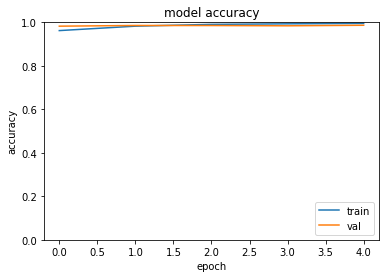

In [19]:
# Plot training accuracy history
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.ylim(0,1)
plt.legend(['train', 'val'], loc='lower right')
plt.show()

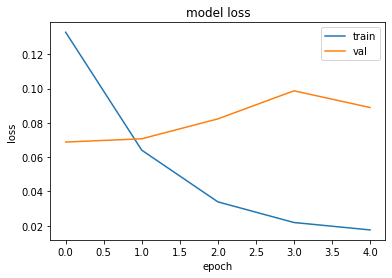

In [20]:
# Plot training loss history
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.show()

In [21]:
test_loss, test_accuracy = model.evaluate(X_test_std, y_test)

print(f'Test loss: {test_loss}')
print(f'Test accuracy: {test_accuracy}')

188/188 [==============================] - 17s 90ms/step - loss: 0.0402 - accuracy: 0.9882
Test loss: 0.04018406197428703
Test accuracy: 0.9881666898727417


In [22]:
y_pred_proba = model.predict(X_test_std)

y_pred_test = np.array([np.argmax(y) for y in y_pred_proba])
y_pred_test

array([3, 7, 7, ..., 7, 0, 8], dtype=int64)

In [23]:
y_true_test = np.array([np.argmax(y) for y in y_test])
y_true_test

array([3, 7, 7, ..., 7, 0, 8], dtype=int64)

In [24]:
# Classification Report
# All classes have similar metrics
print(classification_report(y_true_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       600
           1       1.00      0.98      0.99       600
           2       0.99      0.99      0.99       600
           3       0.99      0.98      0.99       600
           4       0.98      1.00      0.99       600
           5       1.00      0.98      0.99       600
           6       0.98      0.99      0.99       600
           7       0.97      0.99      0.98       600
           8       0.99      0.99      0.99       600
           9       0.99      0.99      0.99       600

    accuracy                           0.99      6000
   macro avg       0.99      0.99      0.99      6000
weighted avg       0.99      0.99      0.99      6000



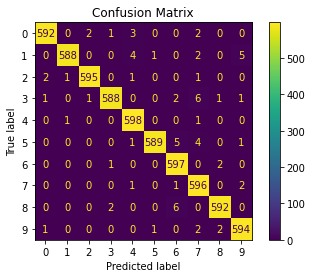

In [25]:
# Confusion matrix shows the very good results
ConfusionMatrixDisplay.from_predictions(y_true_test, y_pred_test)
plt.title('Confusion Matrix')
plt.show()

In [31]:
# Test on real data

# Load data
test_path = Path('testdata/Test_1_01_short.wav')

signal, sr = librosa.load(test_path, sr=None) # sr=None; load file with original sampling rate
sr = librosa.get_samplerate(test_path)
print('Sampling rate: ', sr)
duration = librosa.get_duration(signal, sr=sr)
print('Duration: ', duration)

Sampling rate:  48000
Duration:  0.9


In [32]:
Audio(signal, rate=sr)

In [33]:
# Preprocess
signal, sr = librosa.load(test_path, sr=8000) # Default sr
        
# Padding signal
n_zeros = sr - len(signal)
n_zeros_front = int(n_zeros*.5)
n_zeros_back = n_zeros - n_zeros_front
signal_padded = np.pad(signal, (n_zeros_front, n_zeros_back))

# Perform sftf and convert to db scale
stft = np.abs(librosa.stft(signal_padded, n_fft=512, hop_length=35))
stft_db = librosa.amplitude_to_db(stft, ref=np.max)
stft_db = stft_db.reshape(1, stft_db.shape[0], stft_db.shape[1])

stft_db.shape

(1, 257, 229)

In [34]:
# Scaling
X_new = stft_db.reshape(1, n_rows * n_cols)
X_new_std = scaler.transform(X_new)
X_new_std = X_new_std.reshape(1, n_rows, n_cols, 1) # Reshape to 4D - needed for CCN

In [35]:
# Test
y_pred_new = model.predict(X_new_std)
np.argmax(y_pred_new)

1

### 1.5. Mel Spectrogram model

In [67]:
# Load preprocessed data
preprocessed_data_df = pd.read_pickle('preprocessed_data.pkl')
preprocessed_data_df.head()

,speaker,digit,repetition,file,signal_padded,stft_db,mel_db,mfcc
0,01,0,0,0_01_0.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-92.53915, -92.53915, -92.53915, -92.53915,...","[[[-1046.9609, -1046.9609, -1046.9609, -1046.9..."
1,01,0,1,0_01_1.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-97.5652, -97.5652, -97.5652, -97.5652, -97...","[[[-1103.8242, -1103.8242, -1103.8242, -1103.8..."
2,01,0,10,0_01_10.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-88.62083, -88.62083, -88.62083, -88.62083,...","[[[-1002.6302, -1002.6302, -1002.6302, -1002.6..."
3,01,0,11,0_01_11.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-90.27966, -90.27966, -90.27966, -90.27966,...","[[[-1021.39777, -1021.39777, -1021.39777, -102..."
4,01,0,12,0_01_12.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-93.71318, -93.71318, -93.71318, -93.71318,...","[[[-1060.2435, -1060.2435, -1060.2435, -1060.2..."


In [68]:
# MFCC feature
X = preprocessed_data_df['mel_db'].values
X = np.concatenate(X, axis=0)
X.shape

(30000, 128, 229)

In [69]:
n_recs = X.shape[0]
n_rows = X.shape[1]
n_cols = X.shape[2]

In [74]:
X = X.reshape(n_recs, n_rows*n_cols) # Flatten for StandardScaling
X.shape

(30000, 29312)

In [75]:
# Target variable
y = preprocessed_data_df['digit'].values

# To categorical - for softmax multiclass in keras
y = to_categorical(y, num_classes=10)
y.shape

(30000, 10)

In [76]:
# Filenames
files = preprocessed_data_df['file'].values
files.shape

(30000,)

In [77]:
# Train/test split with stratify on y (we want all digits being evenly represented in train and test)
X_train, X_test, y_train, y_test, files_train, files_test = train_test_split(X, y, files, test_size=0.2, stratify=y)
print('X_train: ', X_train.shape)
print('y_train: ', y_train.shape)
print('files_train: ', files_train.shape)
print('X_test: ', X_test.shape)
print('y_test: ', y_test.shape)
print('files_test: ', files_test.shape)

X_train:  (24000, 29312)
y_train:  (24000, 10)
files_train:  (24000,)
X_test:  (6000, 29312)
y_test:  (6000, 10)
files_test:  (6000,)


In [78]:
# Fit StandardScaler on training data
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [79]:
X_train_std = X_train_std.reshape(X_train.shape[0], n_rows, n_cols, 1) # Reshape to 4D - needed for CCN
X_test_std = X_test_std.reshape(X_test.shape[0], n_rows, n_cols, 1)

X_train_std.shape, X_test_std.shape

((24000, 128, 229, 1), (6000, 128, 229, 1))

In [80]:
# Build simple CNN
model = Sequential([
    Conv2D(filters=64, kernel_size=10, strides=2, padding='same', activation='relu', input_shape=(n_rows, n_cols, 1)),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Conv2D(filters=32, kernel_size=5, strides=2, padding='same', activation='relu'),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Flatten(),
    #Dropout(0.5),
    Dense(units=60, activation='relu'),
    Dense(units=10, activation='softmax')
])

model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 64, 115, 64)       6464      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 32, 58, 64)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 16, 29, 32)        51232     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 8, 15, 32)         0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 3840)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 60)                230460    
_________________________________________________________________
dense_5 (Dense)              (None, 10)               

In [81]:
# Model checkpoint to save best model
checkpoint_path = 'models/best_model_mel'
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

In [82]:
# Compile the model with adam optimizer and default settings
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [83]:
# Fit
history = model.fit(X_train_std, y_train, epochs=5, validation_split=0.2, batch_size=128, callbacks=[checkpoint])

Epoch 1/5
150/150 [==============================] - 117s 776ms/step - loss: 0.6656 - accuracy: 0.7843 - val_loss: 0.0721 - val_accuracy: 0.9800

Epoch 00001: val_accuracy improved from -inf to 0.98000, saving model to models\best_model_mel
INFO:tensorflow:Assets written to: models\best_model_mel\assets
Epoch 2/5
150/150 [==============================] - 148s 988ms/step - loss: 0.0486 - accuracy: 0.9876 - val_loss: 0.0575 - val_accuracy: 0.9825

Epoch 00002: val_accuracy improved from 0.98000 to 0.98250, saving model to models\best_model_mel
INFO:tensorflow:Assets written to: models\best_model_mel\assets
Epoch 3/5
150/150 [==============================] - 188s 1s/step - loss: 0.0297 - accuracy: 0.9916 - val_loss: 0.0249 - val_accuracy: 0.9954

Epoch 00003: val_accuracy improved from 0.98250 to 0.99542, saving model to models\best_model_mel
INFO:tensorflow:Assets written to: models\best_model_mel\assets
Epoch 4/5
150/150 [==============================] - 196s 1s/step - loss: 0.0191 -

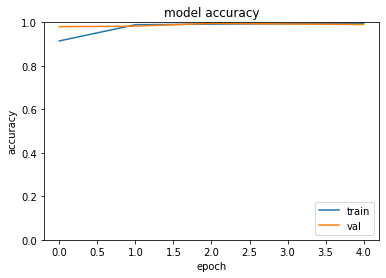

In [84]:
# Plot training accuracy history
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.ylim(0,1)
plt.legend(['train', 'val'], loc='lower right')
plt.show()

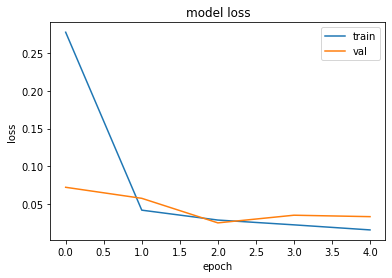

In [85]:
# Plot training loss history
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.show()

In [86]:
test_loss, test_accuracy = model.evaluate(X_test_std, y_test)

print(f'Test loss: {test_loss}')
print(f'Test accuracy: {test_accuracy}')

188/188 [==============================] - 10s 53ms/step - loss: 0.0300 - accuracy: 0.9932
Test loss: 0.030020909383893013
Test accuracy: 0.9931666851043701


In [87]:
y_pred_proba = model.predict(X_test_std)

y_pred_test = np.array([np.argmax(y) for y in y_pred_proba])
y_pred_test

array([8, 8, 3, ..., 3, 6, 7], dtype=int64)

In [88]:
y_true_test = np.array([np.argmax(y) for y in y_test])
y_true_test

array([8, 8, 3, ..., 3, 6, 7], dtype=int64)

In [89]:
# Classification Report
# All classes have similar metrics
print(classification_report(y_true_test, y_pred_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       600
           1       1.00      0.98      0.99       600
           2       1.00      1.00      1.00       600
           3       0.99      1.00      0.99       600
           4       1.00      0.99      1.00       600
           5       0.99      1.00      1.00       600
           6       0.99      1.00      0.99       600
           7       0.99      0.99      0.99       600
           8       1.00      0.98      0.99       600
           9       0.98      1.00      0.99       600

    accuracy                           0.99      6000
   macro avg       0.99      0.99      0.99      6000
weighted avg       0.99      0.99      0.99      6000



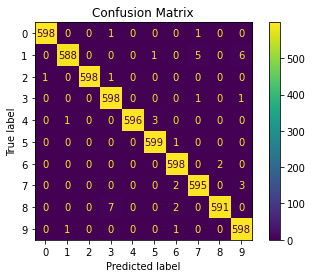

In [90]:
# Confusion matrix shows the very good results
ConfusionMatrixDisplay.from_predictions(y_true_test, y_pred_test)
plt.title('Confusion Matrix')
plt.show()

In [116]:
# Test on real data

# Load data
test_path = Path('testdata/Test_7_01_short.wav')

signal, sr = librosa.load(test_path, sr=None) # sr=None; load file with original sampling rate
sr = librosa.get_samplerate(test_path)
print('Sampling rate: ', sr)
duration = librosa.get_duration(signal, sr=sr)
print('Duration: ', duration)

Sampling rate:  48000
Duration:  0.9771041666666667


In [117]:
# Preprocess
signal, sr = librosa.load(test_path, sr=8000) # Default sr
        
# Padding signal
n_zeros = sr - len(signal)
n_zeros_front = int(n_zeros*.5)
n_zeros_back = n_zeros - n_zeros_front
signal_padded = np.pad(signal, (n_zeros_front, n_zeros_back))

# Extract mel spectrogram and convert to db scale
mel = librosa.feature.melspectrogram(signal_padded, sr=sr, n_fft=512, hop_length=35)
mel_db = librosa.power_to_db(mel)
mel_db = mel_db.reshape(1, mel_db.shape[0], mel_db.shape[1])

mel_db.shape

(1, 128, 229)

In [118]:
# Scaling
X_new = mel_db.reshape(1, n_rows * n_cols)
X_new_std = scaler.transform(X_new)
X_new_std = X_new_std.reshape(1, n_rows, n_cols, 1) # Reshape to 4D - needed for CCN

In [119]:
# Test
y_pred_new = model.predict(X_new_std)
np.argmax(y_pred_new)

7

### 1.6. MFCC model

In [121]:
# Load preprocessed data
preprocessed_data_df = pd.read_pickle('preprocessed_data.pkl')
preprocessed_data_df.head()

,speaker,digit,repetition,file,signal_padded,stft_db,mel_db,mfcc
0,01,0,0,0_01_0.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-92.53915, -92.53915, -92.53915, -92.53915,...","[[[-1046.9609, -1046.9609, -1046.9609, -1046.9..."
1,01,0,1,0_01_1.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-97.5652, -97.5652, -97.5652, -97.5652, -97...","[[[-1103.8242, -1103.8242, -1103.8242, -1103.8..."
2,01,0,10,0_01_10.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-88.62083, -88.62083, -88.62083, -88.62083,...","[[[-1002.6302, -1002.6302, -1002.6302, -1002.6..."
3,01,0,11,0_01_11.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-90.27966, -90.27966, -90.27966, -90.27966,...","[[[-1021.39777, -1021.39777, -1021.39777, -102..."
4,01,0,12,0_01_12.wav,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-80.0, -80.0, -80.0, -80.0, -80.0, -80.0, -...","[[[-93.71318, -93.71318, -93.71318, -93.71318,...","[[[-1060.2435, -1060.2435, -1060.2435, -1060.2..."


In [122]:
# MFCC feature
X = preprocessed_data_df['mfcc'].values
X = np.concatenate(X, axis=0)
X.shape

(30000, 14, 229)

In [123]:
n_recs = X.shape[0]
n_rows = X.shape[1]
n_cols = X.shape[2]

In [124]:
X = X.reshape(n_recs, n_rows*n_cols) # Flatten for StandardScaling
X.shape

(30000, 3206)

In [125]:
# Target variable
y = preprocessed_data_df['digit'].values

# To categorical - for softmax multiclass in keras
y = to_categorical(y, num_classes=10)
y.shape

(30000, 10)

In [126]:
# Filenames
files = preprocessed_data_df['file'].values
files.shape

(30000,)

In [127]:
# Train/test split with stratify on y (we want all digits being evenly represented in train and test)
X_train, X_test, y_train, y_test, files_train, files_test = train_test_split(X, y, files, test_size=0.2, stratify=y)
print('X_train: ', X_train.shape)
print('y_train: ', y_train.shape)
print('files_train: ', files_train.shape)
print('X_test: ', X_test.shape)
print('y_test: ', y_test.shape)
print('files_test: ', files_test.shape)

X_train:  (24000, 3206)
y_train:  (24000, 10)
files_train:  (24000,)
X_test:  (6000, 3206)
y_test:  (6000, 10)
files_test:  (6000,)


In [128]:
# Fit StandardScaler on training data
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_test_std = scaler.transform(X_test)

In [129]:
X_train_std = X_train_std.reshape(X_train.shape[0], n_rows, n_cols, 1) # Reshape to 4D - needed for CCN
X_test_std = X_test_std.reshape(X_test.shape[0], n_rows, n_cols, 1)

X_train_std.shape, X_test_std.shape

((24000, 14, 229, 1), (6000, 14, 229, 1))

In [166]:
# Build simple CNN
model = Sequential([
    Conv2D(filters=64, kernel_size=10, strides=2, padding='same', activation='relu', input_shape=(n_rows, n_cols, 1)),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Conv2D(filters=32, kernel_size=5, strides=2, padding='same', activation='relu'),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Flatten(),
    #Dropout(0.5),
    Dense(units=60, activation='relu'),
    Dense(units=10, activation='softmax')
])

model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_10 (Conv2D)           (None, 7, 115, 64)        6464      
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 4, 58, 64)         0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 2, 29, 32)         51232     
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 1, 15, 32)         0         
_________________________________________________________________
flatten_5 (Flatten)          (None, 480)               0         
_________________________________________________________________
dense_10 (Dense)             (None, 60)                28860     
_________________________________________________________________
dense_11 (Dense)             (None, 10)               

In [167]:
# Model checkpoint to save best model
checkpoint_path = 'models/best_model_mfcc'
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

In [168]:
# Compile the model with adam optimizer and default settings
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [169]:
# Fit
history = model.fit(X_train_std, y_train, epochs=5, validation_split=0.2, batch_size=128, callbacks=[checkpoint])

Epoch 1/5
150/150 [==============================] - 31s 206ms/step - loss: 0.8305 - accuracy: 0.7451 - val_loss: 0.1090 - val_accuracy: 0.9629

Epoch 00001: val_accuracy improved from -inf to 0.96292, saving model to models\best_model_mfcc
INFO:tensorflow:Assets written to: models\best_model_mfcc\assets
Epoch 2/5
150/150 [==============================] - 34s 227ms/step - loss: 0.0546 - accuracy: 0.9842 - val_loss: 0.0426 - val_accuracy: 0.9885

Epoch 00002: val_accuracy improved from 0.96292 to 0.98854, saving model to models\best_model_mfcc
INFO:tensorflow:Assets written to: models\best_model_mfcc\assets
Epoch 3/5
150/150 [==============================] - 36s 241ms/step - loss: 0.0244 - accuracy: 0.9925 - val_loss: 0.0419 - val_accuracy: 0.9898

Epoch 00003: val_accuracy improved from 0.98854 to 0.98979, saving model to models\best_model_mfcc
INFO:tensorflow:Assets written to: models\best_model_mfcc\assets
Epoch 4/5
150/150 [==============================] - 39s 263ms/step - loss: 

In [ ]:
# Plot training accuracy history
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.ylim(0,1)
plt.legend(['train', 'val'], loc='lower right')
plt.show()

# Plot training loss history
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.show()

test_loss, test_accuracy = model.evaluate(X_test_std, y_test)

print(f'Test loss: {test_loss}')
print(f'Test accuracy: {test_accuracy}')

y_pred_proba = model.predict(X_test_std)

y_pred_test = np.array([np.argmax(y) for y in y_pred_proba])
y_pred_test

y_true_test = np.array([np.argmax(y) for y in y_test])
y_true_test

# Classification Report
# All classes have similar metrics
print(classification_report(y_true_test, y_pred_test))

# Confusion matrix shows the very good results
ConfusionMatrixDisplay.from_predictions(y_true_test, y_pred_test)
plt.title('Confusion Matrix')
plt.show()

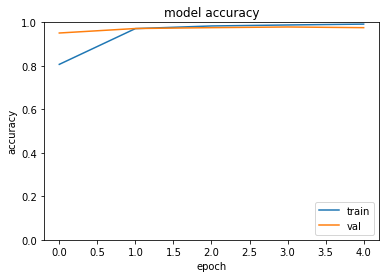

In [151]:
# Plot training accuracy history
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.ylim(0,1)
plt.legend(['train', 'val'], loc='lower right')
plt.show()

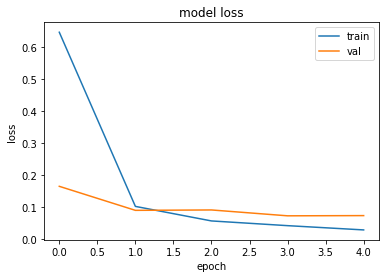

In [152]:
# Plot training loss history
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.show()

In [153]:
test_loss, test_accuracy = model.evaluate(X_test_std, y_test)

print(f'Test loss: {test_loss}')
print(f'Test accuracy: {test_accuracy}')

188/188 [==============================] - 1s 5ms/step - loss: 0.0624 - accuracy: 0.9820
Test loss: 0.06241646409034729
Test accuracy: 0.9819999933242798


In [154]:
y_pred_proba = model.predict(X_test_std)

y_pred_test = np.array([np.argmax(y) for y in y_pred_proba])
y_pred_test

array([2, 6, 9, ..., 2, 9, 4], dtype=int64)

In [155]:
y_true_test = np.array([np.argmax(y) for y in y_test])
y_true_test

array([2, 6, 9, ..., 2, 9, 4], dtype=int64)

In [156]:
# Classification Report
# All classes have similar metrics
print(classification_report(y_true_test, y_pred_test))

              precision    recall  f1-score   support

           0       0.95      1.00      0.97       600
           1       0.96      0.99      0.98       600
           2       0.99      0.98      0.99       600
           3       0.99      0.98      0.99       600
           4       0.99      0.99      0.99       600
           5       0.98      1.00      0.99       600
           6       0.98      0.99      0.99       600
           7       1.00      0.95      0.98       600
           8       0.99      0.98      0.98       600
           9       0.99      0.94      0.97       600

    accuracy                           0.98      6000
   macro avg       0.98      0.98      0.98      6000
weighted avg       0.98      0.98      0.98      6000



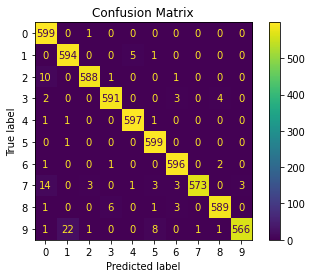

In [157]:
# Confusion matrix shows the very good results
ConfusionMatrixDisplay.from_predictions(y_true_test, y_pred_test)
plt.title('Confusion Matrix')
plt.show()

In [162]:
# Test on real data

# Load data
test_path = Path('testdata/Test_1_01_short.wav')

signal, sr = librosa.load(test_path, sr=None) # sr=None; load file with original sampling rate
sr = librosa.get_samplerate(test_path)
print('Sampling rate: ', sr)
duration = librosa.get_duration(signal, sr=sr)
print('Duration: ', duration)

Sampling rate:  48000
Duration:  0.9


In [163]:
# Preprocess
signal, sr = librosa.load(test_path, sr=8000) # Default sr
        
# Padding signal
n_zeros = sr - len(signal)
n_zeros_front = int(n_zeros*.5)
n_zeros_back = n_zeros - n_zeros_front
signal_padded = np.pad(signal, (n_zeros_front, n_zeros_back))

# Extract MFCC
mfcc = librosa.feature.mfcc(signal_padded, sr=sr, n_fft=512, n_mfcc=14, hop_length=35)
mfcc = mfcc.reshape(1, mfcc.shape[0], mfcc.shape[1])
mfcc.shape

(1, 14, 229)

In [164]:
# Scaling
X_new = mfcc.reshape(1, n_rows * n_cols)
X_new_std = scaler.transform(X_new)
X_new_std = X_new_std.reshape(1, n_rows, n_cols, 1) # Reshape to 4D - needed for CCN

In [165]:
# Test
y_pred_new = model.predict(X_new_std)
np.argmax(y_pred_new)

4

## 2. ESC-50

Further models are built on environmental sound dataset <b>ESC-50</b>

Paper: https://www.karolpiczak.com/papers/Piczak2015-ESC-Dataset.pdf   
Original Dataset: https://github.com/karolpiczak/ESC-50 or https://dataverse.harvard.edu/dataset.xhtml?persistentId=doi:10.7910/DVN/YDEPUT   
Leaderboards: https://github.com/karolpiczak/ESC-50 and https://paperswithcode.com/sota/audio-classification-on-esc-50

Brief description of data (from README):  
The ESC-50 dataset is a labeled collection of 2000 environmental audio recordings suitable for benchmarking methods of environmental sound classification. The dataset consists of 5-second-long recordings organized into 50 semantical classes (with 40 examples per class) loosely arranged into 5 major categories. For shorter recordings than 5-second-long padding with silence was performed. The extracted samples were reconverted to a unified format (44.1 kHz, single channel, compression at 192 kbit/s). 

Filename convention is '{fold}-{src_file}-{take}-{target}.wav'  

fold: Prearranged folder number to perform 5-fold cross-validation (if needed)   
src_file: Original source file id for 5 sec clip   
take: Additional recording from same source file   
target: Class to which the recording belongs

### 2.1. Preliminary EDA

In [2]:
source_path = Path('../ESC-50-master/ESC-50-master/audio')
metadata_path = os.path.join('../ESC-50-master/ESC-50-master/meta/esc50.csv')

In [3]:
metadata_df = pd.read_csv(metadata_path)
metadata_df.head()

,filename,fold,target,category,esc10,src_file,take
0,1-100032-A-0.wav,1,0,dog,True,100032,A
1,1-100038-A-14.wav,1,14,chirping_birds,False,100038,A
2,1-100210-A-36.wav,1,36,vacuum_cleaner,False,100210,A
3,1-100210-B-36.wav,1,36,vacuum_cleaner,False,100210,B
4,1-101296-A-19.wav,1,19,thunderstorm,False,101296,A


In [9]:
# Number of records
metadata_df['filename'].count()

2000

In [10]:
# Distribution per category
metadata_df.groupby('category')['filename'].count()

category
airplane            40
breathing           40
brushing_teeth      40
can_opening         40
car_horn            40
cat                 40
chainsaw            40
chirping_birds      40
church_bells        40
clapping            40
clock_alarm         40
clock_tick          40
coughing            40
cow                 40
crackling_fire      40
crickets            40
crow                40
crying_baby         40
dog                 40
door_wood_creaks    40
door_wood_knock     40
drinking_sipping    40
engine              40
fireworks           40
footsteps           40
frog                40
glass_breaking      40
hand_saw            40
helicopter          40
hen                 40
insects             40
keyboard_typing     40
laughing            40
mouse_click         40
pig                 40
pouring_water       40
rain                40
rooster             40
sea_waves           40
sheep               40
siren               40
sneezing            40
snoring             40
th

In [11]:
# ESC-10 categories
metadata_df[metadata_df['esc10']].groupby(['category', 'target'])['filename'].count().reset_index().sort_values(by='target')

,category,target,filename
4,dog,0,40
7,rooster,1,40
6,rain,10,40
8,sea_waves,11,40
2,crackling_fire,12,40
3,crying_baby,20,40
9,sneezing,21,40
1,clock_tick,38,40
5,helicopter,40,40
0,chainsaw,41,40


In [22]:
example_path = os.path.join(source_path, '1-21934-A-38.wav')

signal, sr = librosa.load(example_path, sr=None) # sr=None; load file with original sampling rate
sr = librosa.get_samplerate(example_path)
print('Sampling rate: ', sr)
duration = librosa.get_duration(signal, sr=sr)
print('Duration: ', duration)

Sampling rate:  44100
Duration:  5.0


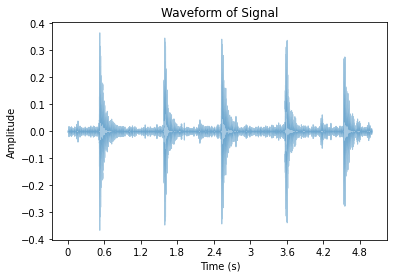

In [23]:
librosa.display.waveshow(signal, sr=sr, alpha=0.4)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Waveform of Signal')
plt.show()

In [24]:
Audio(signal, rate=sr)

In [206]:
# Check signal length distribution over all files
raw_data = []

for file in tqdm(os.listdir(source_path)):
          
    file_path = os.path.join(source_path, file)
    signal, sr = librosa.load(file_path, sr=None) # None = Use original SR

    raw_data.append({
        'file': file,
        'signal': signal,
        'signal_length': len(signal),
        'org_sampling_rate': sr
    })
        
        
raw_data_df = pd.DataFrame(raw_data).sort_values(by=['file'])
raw_data_df.describe() # Verify that signal_length and sampling rate are the same across all files, as stated by original dataset paper

100%|██████████| 2000/2000 [00:08<00:00, 228.43it/s]


,signal_length,org_sampling_rate
count,2000.0,2000.0
mean,220500.0,44100.0
std,0.0,0.0
min,220500.0,44100.0
25%,220500.0,44100.0
50%,220500.0,44100.0
75%,220500.0,44100.0
max,220500.0,44100.0


In [ ]:
# Create a Mel spectrogram for every class with default configuration
# This time we use default n_fft = 2048, since we are not primarely dealing with speech, but with different environmental sounrd

In [4]:
# Get only metadata and files for esc10 data
metadata_esc10_df = metadata_df[metadata_df['esc10']]
esc10_files = metadata_esc10_df['filename'].values
esc10_files[:10]

array(['1-100032-A-0.wav', '1-110389-A-0.wav', '1-116765-A-41.wav',
       '1-17150-A-12.wav', '1-172649-A-40.wav', '1-172649-B-40.wav',
       '1-172649-C-40.wav', '1-172649-D-40.wav', '1-172649-E-40.wav',
       '1-172649-F-40.wav'], dtype=object)

In [16]:
# Get first record for each category
example_files = metadata_esc10_df.groupby('category').first().reset_index()[['category', 'filename']].values
example_files[:10]

array([['chainsaw', '1-116765-A-41.wav'],
       ['clock_tick', '1-21934-A-38.wav'],
       ['crackling_fire', '1-17150-A-12.wav'],
       ['crying_baby', '1-187207-A-20.wav'],
       ['dog', '1-100032-A-0.wav'],
       ['helicopter', '1-172649-A-40.wav'],
       ['rain', '1-17367-A-10.wav'],
       ['rooster', '1-26806-A-1.wav'],
       ['sea_waves', '1-28135-A-11.wav'],
       ['sneezing', '1-26143-A-21.wav']], dtype=object)

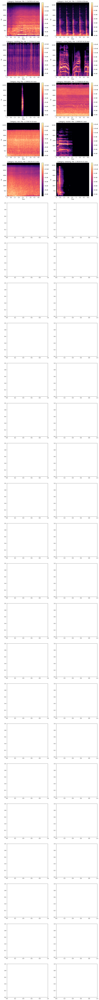

In [17]:
# Create Mel spectrogram plots for one example per category
fig, axs = plt.subplots(nrows=25, ncols=2, figsize=(12, 120))

# loop through digits and axes
for example_file, ax in zip(example_files, axs.ravel()):
    
    # Load file
    example_path = os.path.join(source_path, example_file[1])
    signal, sr = librosa.load(example_path, sr=None)

    # Create Mel spectrogram
    mel = librosa.feature.melspectrogram(signal, sr=sr, n_fft=2048, hop_length=512)
    mel_db = librosa.power_to_db(mel)
    
    # Display spectrogram
    img = librosa.display.specshow(mel_db, x_axis='time', y_axis='mel', ax=ax, sr=sr, hop_length=512, cmap='magma')
    
    # Format plot
    ax.set_title(f'Category: {example_file[0]}, File: {example_file[1]}')
    fig.colorbar(img, ax=ax, format='%+2.0f dB')

fig.tight_layout()
plt.show()

In [20]:
clock_files = metadata_esc10_df[metadata_df['category']=='clock_tick'][['category', 'filename']].values
clock_files[:10]

array([['clock_tick', '1-21934-A-38.wav'],
       ['clock_tick', '1-21935-A-38.wav'],
       ['clock_tick', '1-35687-A-38.wav'],
       ['clock_tick', '1-42139-A-38.wav'],
       ['clock_tick', '1-48413-A-38.wav'],
       ['clock_tick', '1-57163-A-38.wav'],
       ['clock_tick', '1-62849-A-38.wav'],
       ['clock_tick', '1-62850-A-38.wav'],
       ['clock_tick', '2-119748-A-38.wav'],
       ['clock_tick', '2-127108-A-38.wav']], dtype=object)

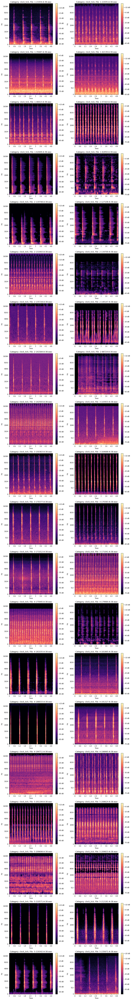

In [21]:
# Create Mel spectrogram plots for all waterdrops (40 samples)
fig, axs = plt.subplots(nrows=20, ncols=2, figsize=(12, 90))

# loop through digits and axes
for example_file, ax in zip(clock_files, axs.ravel()):
    
    # Load file
    example_path = os.path.join(source_path, example_file[1])
    signal, sr = librosa.load(example_path, sr=None)

    # Create Mel spectrogram
    mel = librosa.feature.melspectrogram(signal, sr=sr, n_fft=2048, hop_length=512)
    mel_db = librosa.power_to_db(mel)
    
    # Display spectrogram
    img = librosa.display.specshow(mel_db, x_axis='time', y_axis='mel', ax=ax, sr=sr, hop_length=512, cmap='magma')
    
    # Format plot
    ax.set_title(f'Category: {example_file[0]}, File: {example_file[1]}')
    fig.colorbar(img, ax=ax, format='%+2.0f dB')

fig.tight_layout()
plt.show()

In [25]:
# Spectrogram for all dogs
dog_files = metadata_df[metadata_df['category']=='dog'][['category', 'filename']].values
dog_files[:10]

array([['dog', '1-100032-A-0.wav'],
       ['dog', '1-110389-A-0.wav'],
       ['dog', '1-30226-A-0.wav'],
       ['dog', '1-30344-A-0.wav'],
       ['dog', '1-32318-A-0.wav'],
       ['dog', '1-59513-A-0.wav'],
       ['dog', '1-85362-A-0.wav'],
       ['dog', '1-97392-A-0.wav'],
       ['dog', '2-114280-A-0.wav'],
       ['dog', '2-114587-A-0.wav']], dtype=object)

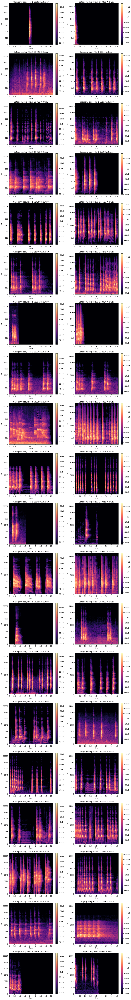

In [26]:
# Example all dogs

# Create Mel spectrogram plots for all dogs (40 samples)
fig, axs = plt.subplots(nrows=20, ncols=2, figsize=(12, 90))

# loop through digits and axes
for example_file, ax in zip(dog_files, axs.ravel()):
    
    # Load file
    example_path = os.path.join(source_path, example_file[1])
    signal, sr = librosa.load(example_path, sr=None)

    # Create Mel spectrogram
    mel = librosa.feature.melspectrogram(signal, sr=sr, n_fft=2048, hop_length=512)
    mel_db = librosa.power_to_db(mel)
    
    # Display spectrogram
    img = librosa.display.specshow(mel_db, x_axis='time', y_axis='mel', ax=ax, sr=sr, hop_length=512, cmap='magma')
    
    # Format plot
    ax.set_title(f'Category: {example_file[0]}, File: {example_file[1]}')
    fig.colorbar(img, ax=ax, format='%+2.0f dB')

fig.tight_layout()
plt.show()

In [27]:
# Example dogs
example_path = os.path.join(source_path, '1-59513-A-0.wav')
signal, sr = librosa.load(example_path, sr=None)

Audio(signal, rate=sr)

### 2.2. Mel spectrogram model using CNN without data augmentation
Parameter grid search with on the fly mel spectrogram generation (i.e. part of training process)

In [6]:
n_fft = 2048 # Default of librosa
hop_length = 512 # Default of librosa, i.e. n_fft / 4
n_mels = 128 # Default of librosa
sr_all = 44100 # Original SR
num_classes = 10 # For ESC10

# Remap original labels for ESC10 data
label_map = {
    0: 0,  # dog
    1: 1,  # rooster
    10: 2, # rain
    11: 3, # sea_waves
    12: 4, # crackling_fire
    20: 5, # crying_baby
    21: 6, # sneezing
    38: 7, # clock_tick
    40: 8, # helicopter
    41: 9  # chainsaw
}

label_names = [
    'dog',
    'rooster',
    'rain',
    'sea_waves',
    'crackling_fire',
    'crying_baby',
    'sneezing',
    'clock_tick',
    'helicopter',
    'chainsaw'
]

In [30]:
# Load file
example_path = os.path.join(source_path, '1-59513-A-0.wav')
signal, sr = librosa.load(example_path, sr=sr_all)

# Create Mel spectrogram
mel = librosa.feature.melspectrogram(signal, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
mel_db = librosa.power_to_db(mel)

print(mel_db.shape)

(128, 431)


In [56]:
# Create spectrograms for all ESC-10 files
preprocessed_data = []

for file in tqdm(esc10_files):
    
    # Load file
    file_path = os.path.join(source_path, file)
    signal, sr = librosa.load(file_path, sr=sr_all)

    # Create Mel Spectrogram and convert to db scale
    mel = librosa.feature.melspectrogram(signal, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
    mel_db = librosa.power_to_db(mel)
    mel_db = mel_db.reshape(1, mel_db.shape[0], mel_db.shape[1])
    
    # Extract class label from filename
    label_org = int(file.split('-')[-1].split('.')[0])
    
    # Get new label from label map
    label = label_map[label_org]

    preprocessed_data.append({
        'file': file,
        'label': label,
        'signal': signal,
        'mel_db': mel_db
    })

preprocessed_data_df = pd.DataFrame(preprocessed_data)
preprocessed_data_df.head()

100%|██████████| 400/400 [00:05<00:00, 66.98it/s]


,file,label,signal,mel_db
0,1-100032-A-0.wav,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[[[-53.3022, -53.3022, -53.3022, -53.3022, -53..."
1,1-110389-A-0.wav,0,"[-0.0025634766, -0.0011291504, 0.00012207031, ...","[[[-10.220087, 0.27027115, 2.8102493, 0.202547..."
2,1-116765-A-41.wav,9,"[-0.01260376, -0.015045166, -0.0154418945, -0....","[[[-22.876083, -27.223824, -31.730383, -29.084..."
3,1-17150-A-12.wav,4,"[0.0014343262, 0.0017700195, 0.0015563965, 0.0...","[[[-19.44487, -17.593687, -19.15633, -17.98147..."
4,1-172649-A-40.wav,8,"[0.11935425, 0.1296997, 0.14428711, 0.20455933...","[[[9.375204, 14.343754, 10.94474, 10.635153, 1..."


In [57]:
# Save data
preprocessed_data_df.to_pickle('preprocessed_data_esc10.pkl')

In [87]:
preprocessed_data_df = pd.read_pickle('preprocessed_data_esc10.pkl')

In [88]:
# Distinct labels
np.sort(preprocessed_data_df['label'].unique())

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9], dtype=int64)

In [89]:
# Spectrogram feature
X = preprocessed_data_df['mel_db'].values
X = np.concatenate(X, axis=0)
print(X.shape)

n_recs = X.shape[0]
n_rows = X.shape[1]
n_cols = X.shape[2]

X = X.reshape(n_recs, n_rows*n_cols) # Flatten for StandardScaling
print(X.shape)

# Target variable
y = preprocessed_data_df['label'].values

# To categorical - for softmax multiclass in keras
y = to_categorical(y, num_classes=num_classes)
print(y.shape)

# Filenames
files = preprocessed_data_df['file'].values
print(files.shape)

# Train/test split with stratify on y (we want all digits being evenly represented in train and test)
X_train, X_test, y_train, y_test, files_train, files_test = train_test_split(X, y, files, test_size=0.2, stratify=y, random_state=42)

# Split train set from above in train and valid set, so we have train, valid and test set
X_train, X_valid, y_train, y_valid, files_train, files_valid = train_test_split(X_train, y_train, files_train, test_size=0.2, stratify=y_train, random_state=42)
print('X_train: ', X_train.shape)
print('y_train: ', y_train.shape)
print('files_train: ', files_train.shape)
print('X_valid: ', X_valid.shape)
print('y_valid: ', y_valid.shape)
print('files_valid: ', files_valid.shape)
print('X_test: ', X_test.shape)
print('y_test: ', y_test.shape)
print('files_test: ', files_test.shape)

# Fit StandardScaler on training data
scaler = StandardScaler()
X_train_std = scaler.fit_transform(X_train)
X_valid_std = scaler.transform(X_valid)
X_test_std = scaler.transform(X_test)

X_train_std = X_train_std.reshape(X_train.shape[0], n_rows, n_cols, 1) # Reshape to 4D - needed for CCN
X_valid_std = X_valid_std.reshape(X_valid.shape[0], n_rows, n_cols, 1)
X_test_std = X_test_std.reshape(X_test.shape[0], n_rows, n_cols, 1)

print(X_train_std.shape, X_valid_std.shape, X_test_std.shape)

(400, 128, 431)
(400, 55168)
(400, 10)
(400,)
X_train:  (256, 55168)
y_train:  (256, 10)
files_train:  (256,)
X_valid:  (64, 55168)
y_valid:  (64, 10)
files_valid:  (64,)
X_test:  (80, 55168)
y_test:  (80, 10)
files_test:  (80,)
(256, 128, 431, 1) (64, 128, 431, 1) (80, 128, 431, 1)


In [90]:
# Build and train CNN
model = Sequential([
    Conv2D(filters=64, kernel_size=10, strides=2, padding='same', activation='relu', input_shape=(n_rows, n_cols, 1)),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Conv2D(filters=32, kernel_size=10, strides=2, padding='same', activation='relu'),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Conv2D(filters=32, kernel_size=5, strides=2, padding='same', activation='relu'),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Flatten(),
    Dropout(0.5),
    Dense(units=150, activation='relu'),
    Dense(units=num_classes, activation='softmax')
])

model.summary()

# Model checkpoint to save best model
checkpoint_path = 'models/best_model_esc10_mel'
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

early_stopping = EarlyStopping(monitor='val_loss', patience=5)

# Compile the model with adam optimizer and default settings
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Fit
history = model.fit(X_train_std, y_train, epochs=20, validation_data=(X_valid_std, y_valid), batch_size=64, callbacks=[checkpoint])

Model: "sequential_31"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_93 (Conv2D)           (None, 64, 216, 64)       6464      
_________________________________________________________________
max_pooling2d_93 (MaxPooling (None, 32, 108, 64)       0         
_________________________________________________________________
conv2d_94 (Conv2D)           (None, 16, 54, 32)        204832    
_________________________________________________________________
max_pooling2d_94 (MaxPooling (None, 8, 27, 32)         0         
_________________________________________________________________
conv2d_95 (Conv2D)           (None, 4, 14, 32)         25632     
_________________________________________________________________
max_pooling2d_95 (MaxPooling (None, 2, 7, 32)          0         
_________________________________________________________________
flatten_31 (Flatten)         (None, 448)             

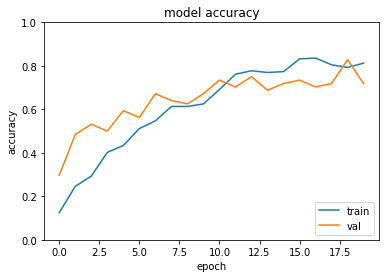

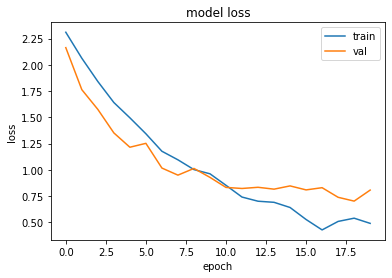

3/3 [==============================] - 1s 264ms/step - loss: 0.5222 - accuracy: 0.7875
Test loss: 0.5222265124320984
Test accuracy: 0.7875000238418579
                precision    recall  f1-score   support

           dog       0.86      0.75      0.80         8
       rooster       0.89      1.00      0.94         8
          rain       0.83      0.62      0.71         8
     sea_waves       0.50      0.88      0.64         8
crackling_fire       1.00      0.88      0.93         8
   crying_baby       1.00      0.62      0.77         8
      sneezing       0.67      1.00      0.80         8
    clock_tick       0.88      0.88      0.88         8
    helicopter       0.88      0.88      0.88         8
      chainsaw       0.75      0.38      0.50         8

      accuracy                           0.79        80
     macro avg       0.82      0.79      0.78        80
  weighted avg       0.82      0.79      0.78        80



[]

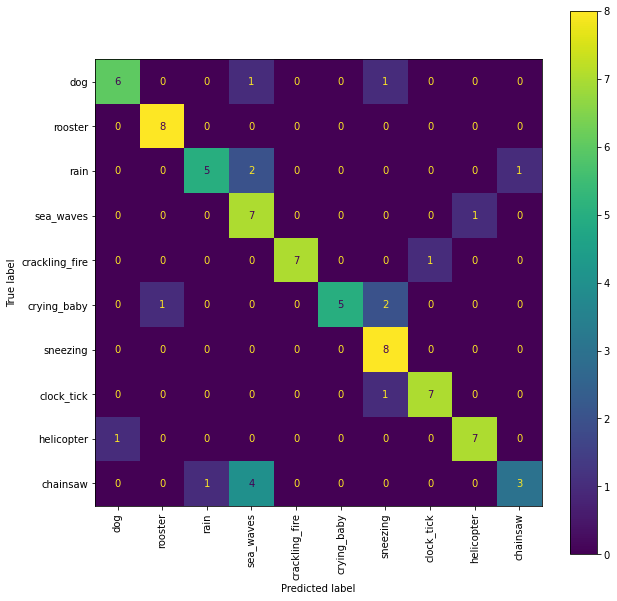

In [91]:
# Load best model
model = tf.keras.models.load_model(checkpoint_path)

# Plot training accuracy history
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.ylim(0,1)
plt.legend(['train', 'val'], loc='lower right')
plt.show()

# Plot training loss history
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.show()

test_loss, test_accuracy = model.evaluate(X_test_std, y_test)

print(f'Test loss: {test_loss}')
print(f'Test accuracy: {test_accuracy}')

y_pred_proba = model.predict(X_test_std)
y_pred_test = np.array([np.argmax(y) for y in y_pred_proba])
y_true_test = np.array([np.argmax(y) for y in y_test])

# Classification Report
print(classification_report(y_true_test, y_pred_test, target_names=label_names))

# Confusion matrix
fig, ax = plt.subplots(figsize=(10,10))
cmp = ConfusionMatrixDisplay.from_predictions(y_true_test, y_pred_test, display_labels=label_names, xticks_rotation='vertical', ax=ax)
plt.plot()

### 2.3. Mel spectrogram model using CNN and data augmentation
Following data augmentation techniques are used:
- Noise
- Time shifting (move to left/right and feel with silence)
- Time stretching (speed up or slow down)
    - Audiomentions makes zero-right-padding if result is less than before; keep up to limit, cut rest
- Pitch shifting (increase/decrease frequency)
- Random gain (increase amplitude/loudness)

Augmentation is performed offline (i.e. not part of the CNN learning) and only on training data set and not on test and validation set. All augmentation is performed on signal and not on spectrogram.

Augmentation technique is chosen randomly and for each category the training data amount is doubled

Audiomentation Library is used to perform all augmentations and build augmentation pipeline

In [86]:
files_train[:15]

array(['4-198965-A-38.wav', '5-221518-A-21.wav', '3-120644-A-12.wav',
       '2-118104-A-21.wav', '2-28314-B-12.wav', '4-164064-A-1.wav',
       '3-150979-A-40.wav', '2-96460-A-1.wav', '4-171519-A-21.wav',
       '3-142005-A-10.wav', '5-203739-A-10.wav', '5-170338-B-41.wav',
       '1-47273-A-21.wav', '1-40730-A-1.wav', '3-164688-A-38.wav'],
      dtype=object)

In [87]:
# Original example
example_path = os.path.join(source_path, '3-164688-A-38.wav') # clock tick
signal, sr = librosa.load(example_path, sr=None)

Audio(signal, rate=sr)

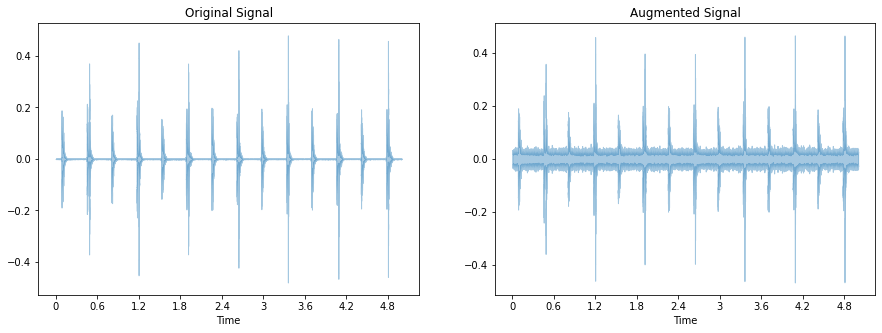

In [88]:
# Add Noise
augment = Compose([
    # p is the probability that the augmentation is used in the pipeline
    AddGaussianNoise(min_amplitude=0.01, max_amplitude=0.015, p=1.0)
])

# Augment/transform/perturb the audio data
augmented_signal = augment(samples=signal, sample_rate=sr)

# Display Waveform
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
librosa.display.waveshow(signal, sr=sr, alpha=0.4, ax=axs[0])
librosa.display.waveshow(augmented_signal, sr=sr, alpha=0.4, ax=axs[1])
axs[0].set_title('Original Signal')
axs[1].set_title('Augmented Signal')

Audio(augmented_signal, rate=sr)

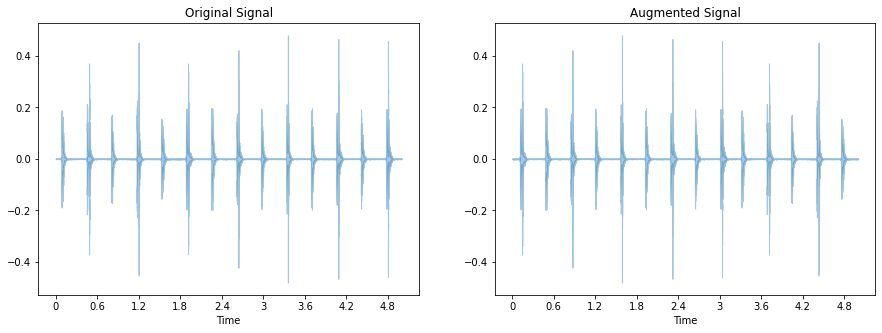

In [89]:
# Time shifting
augment = Compose([
    Shift(min_fraction=-1, max_fraction=1, p=1.0),
])

# Augment/transform/perturb the audio data
augmented_signal = augment(samples=signal, sample_rate=sr)

# Display Waveform
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
librosa.display.waveshow(signal, sr=sr, alpha=0.4, ax=axs[0])
librosa.display.waveshow(augmented_signal, sr=sr, alpha=0.4, ax=axs[1])
axs[0].set_title('Original Signal')
axs[1].set_title('Augmented Signal')

Audio(augmented_signal, rate=sr)

Augmented Signal Length:  5.0
Original Signal Length:  5.0


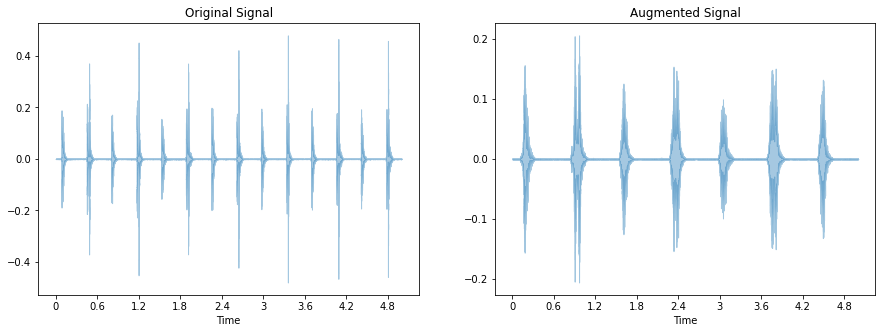

In [90]:
# Time stretching (speeding up or slowing down)
augment = Compose([
    # min_rate/max_rate, rate by how much signal is stretched (e.g. 0.5 is half the original speed)
    TimeStretch(min_rate=0.5, max_rate=1.5, p=1.0) 
])

# Augment/transform/perturb the audio data
augmented_signal = augment(samples=signal, sample_rate=sr)

# Display Waveform
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
librosa.display.waveshow(signal, sr=sr, alpha=0.4, ax=axs[0])
librosa.display.waveshow(augmented_signal, sr=sr, alpha=0.4, ax=axs[1])
axs[0].set_title('Original Signal')
axs[1].set_title('Augmented Signal')

# Signal after augmentation has still the same length, but is right-padded with silence
print('Augmented Signal Length: ', librosa.get_duration(augmented_signal, sr=sr))
print('Original Signal Length: ', librosa.get_duration(signal, sr=sr))

Audio(augmented_signal, rate=sr)

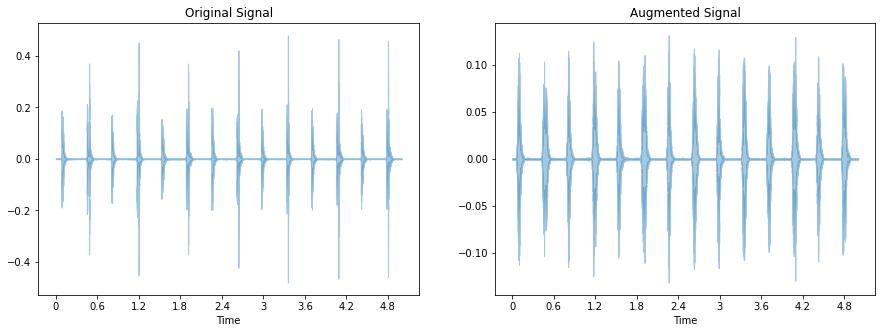

In [91]:
# Pitch shifting (increase/decrease frequency), no change to tempo
augment = Compose([
    PitchShift(min_semitones=-12, max_semitones=12, p=1.0)
])

augmented_signal = augment(samples=signal, sample_rate=sr)

# Display Waveform
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
librosa.display.waveshow(signal, sr=sr, alpha=0.4, ax=axs[0])
librosa.display.waveshow(augmented_signal, sr=sr, alpha=0.4, ax=axs[1])
axs[0].set_title('Original Signal')
axs[1].set_title('Augmented Signal')

Audio(augmented_signal, rate=sr)

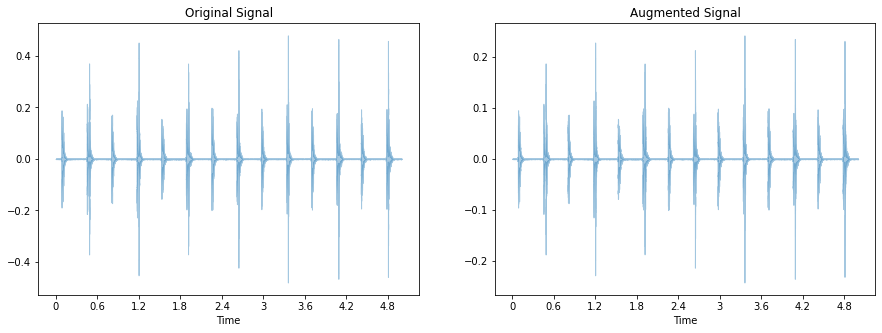

In [92]:
# Gain (increase/decrease loudness)
augment = Compose([
    Gain(min_gain_in_db=-10, max_gain_in_db=10, p=1.0)
])

augmented_signal = augment(samples=signal, sample_rate=sr)

# Display Waveform
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
librosa.display.waveshow(signal, sr=sr, alpha=0.4, ax=axs[0])
librosa.display.waveshow(augmented_signal, sr=sr, alpha=0.4, ax=axs[1])
axs[0].set_title('Original Signal')
axs[1].set_title('Augmented Signal')

Audio(augmented_signal, rate=sr, normalize=False)

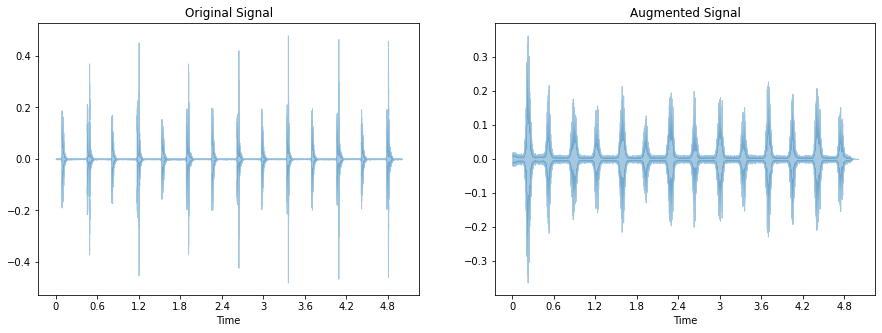

In [93]:
# Pipeline with all augmentations, whereas every augmentation is performed with p=1.0
augment = Compose([
    AddGaussianNoise(min_amplitude=0.001, max_amplitude=0.015, p=1.0),
    Shift(min_fraction=-1, max_fraction=1, p=1.0),
    TimeStretch(min_rate=0.5, max_rate=1.5, p=1.0),
    PitchShift(min_semitones=-12, max_semitones=12, p=1.0),
    Gain(min_gain_in_db=-10, max_gain_in_db=10, p=1.0)
])

augmented_signal = augment(samples=signal, sample_rate=sr)

# Display Waveform
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
librosa.display.waveshow(signal, sr=sr, alpha=0.4, ax=axs[0])
librosa.display.waveshow(augmented_signal, sr=sr, alpha=0.4, ax=axs[1])
axs[0].set_title('Original Signal')
axs[1].set_title('Augmented Signal')

Audio(augmented_signal, rate=sr, normalize=False)

In [94]:
# Another example augmentations
example_path = os.path.join(source_path, '1-17124-A-43.wav')
signal, sr = librosa.load(example_path, sr=None)

Audio(signal, rate=sr)

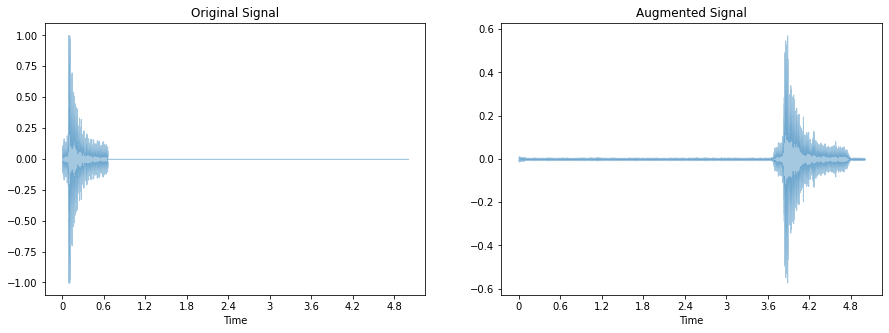

In [95]:
augmented_signal = augment(samples=signal, sample_rate=sr)

# Display Waveform
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
librosa.display.waveshow(signal, sr=sr, alpha=0.4, ax=axs[0])
librosa.display.waveshow(augmented_signal, sr=sr, alpha=0.4, ax=axs[1])
axs[0].set_title('Original Signal')
axs[1].set_title('Augmented Signal')

Audio(augmented_signal, rate=sr, normalize=False)

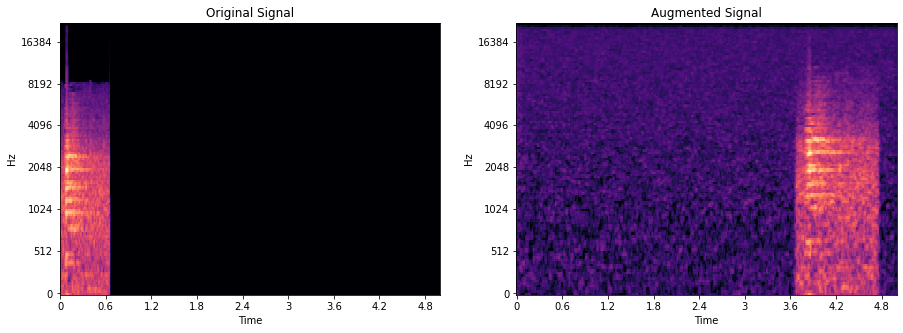

In [96]:
# Create Mel spectrogram original and augmented
mel = librosa.feature.melspectrogram(signal, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
mel_db = librosa.power_to_db(mel)

mel_aug = librosa.feature.melspectrogram(augmented_signal, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
mel_db_aug = librosa.power_to_db(mel_aug)

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
librosa.display.specshow(mel_db, x_axis='time', y_axis='mel', ax=axs[0], sr=sr, hop_length=hop_length, cmap='magma')
librosa.display.specshow(mel_db_aug, x_axis='time', y_axis='mel', ax=axs[1], sr=sr, hop_length=hop_length, cmap='magma')
axs[0].set_title('Original Signal')
axs[1].set_title('Augmented Signal')
plt.show()

In [97]:
preprocessed_augmented_data = []

# Iterate through training files and create an augmented version for each, i.e. double the amount of training data
for file_train in tqdm(files_train):
    
    # Load file
    file_path = os.path.join(source_path, file_train)
    signal, sr = librosa.load(file_path, sr=sr_all)

    # Augment data
    augmented_signal = augment(samples=signal, sample_rate=sr)

    # Create Mel Spectrogram and convert to db scale
    mel = librosa.feature.melspectrogram(augmented_signal, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
    mel_db = librosa.power_to_db(mel)
    mel_db = mel_db.reshape(1, mel_db.shape[0], mel_db.shape[1])
    
    # Extract class label from file name
    label_org = int(file_train.split('-')[-1].split('.')[0])
    
    # Get new label from label map
    label = label_map[label_org]

    preprocessed_augmented_data.append({
        'original_file': file_train,
        'label': label,
        'signal': augmented_signal,
        'mel_db': mel_db
    })

preprocessed_augmented_data_df = pd.DataFrame(preprocessed_augmented_data)
preprocessed_augmented_data_df.head()

100%|██████████| 256/256 [02:15<00:00,  1.89it/s]


,original_file,label,signal,mel_db
0,4-198965-A-38.wav,7,"[-0.0054802597, -0.0038028287, 0.0004848113, -...","[[[-21.934002, -19.716337, -21.716616, -27.575..."
1,5-221518-A-21.wav,6,"[-0.0008060812, -0.0067617483, -0.0058536627, ...","[[[-36.12893, -36.12439, -35.698, -33.352333, ..."
2,3-120644-A-12.wav,4,"[-0.0012799372, 0.00018340613, 0.00279705, 0.0...","[[[0.7032878, 3.9970121, 4.408907, 2.013706, -..."
3,2-118104-A-21.wav,6,"[0.00020468842, -0.0016054737, -0.0004374784, ...","[[[-38.96955, -38.305336, -42.408672, -46.3244..."
4,2-28314-B-12.wav,4,"[-0.0023565497, 0.013027733, 0.032121494, 0.02...","[[[-13.477949, -6.6325307, -6.4565616, -6.2998..."


In [98]:
# Save data
preprocessed_augmented_data_df.to_pickle('preprocessed_augmented_data_esc10.pkl')

In [99]:
preprocessed_augmented_data_df.count()

original_file    256
label            256
signal           256
mel_db           256
dtype: int64

In [92]:
# Load data
preprocessed_augmented_data_df = pd.read_pickle('preprocessed_augmented_data_esc10.pkl')

In [93]:
X_aug = preprocessed_augmented_data_df['mel_db'].values
X_aug = np.concatenate(X_aug, axis=0)

n_aug_recs = X_aug.shape[0]
n_aug_rows = X_aug.shape[1]
n_aug_cols = X_aug.shape[2]

X_aug = X_aug.reshape(n_aug_recs, n_aug_rows*n_aug_cols) # Flatten for StandardScaling
X_aug.shape

(256, 55168)

In [94]:
# Concat original train and augmented train data
X_train_all = np.concatenate([X_aug, X_train], axis=0)
X_train_all.shape

(512, 55168)

In [95]:
# To categorical of augmented labels and validation labels and concat with original train labels
y_aug = preprocessed_augmented_data_df['label'].values
y_aug = to_categorical(y_aug, num_classes=num_classes)
y_aug.shape

(256, 10)

In [96]:
y_train_all = np.concatenate([y_aug, y_train], axis=0)
y_train_all.shape

(512, 10)

In [97]:
# Fit StandardScaler on training data incl. augmented data and transform valid and test set
scaler = StandardScaler()
X_train_all_std = scaler.fit_transform(X_train_all)
X_valid_std = scaler.transform(X_valid)
X_test_std = scaler.transform(X_test)

X_train_all_std = X_train_all_std.reshape(X_train_all.shape[0], n_rows, n_cols, 1) # Reshape to 4D - needed for CCN
X_valid_std = X_valid_std.reshape(X_valid.shape[0], n_rows, n_cols, 1)
X_test_std = X_test_std.reshape(X_test.shape[0], n_rows, n_cols, 1)

print(X_train_all_std.shape, X_valid_std.shape, X_test_std.shape)

(512, 128, 431, 1) (64, 128, 431, 1) (80, 128, 431, 1)


In [100]:
# Build and train CNN
model = Sequential([
    Conv2D(filters=64, kernel_size=10, strides=2, padding='same', activation='relu', input_shape=(n_rows, n_cols, 1)),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Conv2D(filters=32, kernel_size=10, strides=2, padding='same', activation='relu'),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Conv2D(filters=32, kernel_size=5, strides=2, padding='same', activation='relu'),
    MaxPool2D(pool_size=2, strides=2, padding='same'),
    Flatten(),
    Dropout(0.5),
    Dense(units=150, activation='relu'),
    Dense(units=num_classes, activation='softmax')
])

model.summary()

# Model checkpoint to save best model
checkpoint_path = 'models/best_model_esc10_aug_mel'
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

early_stopping = EarlyStopping(monitor='val_loss', patience=5)

# Compile the model with adam optimizer and default settings
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Fit
history = model.fit(X_train_all_std, y_train_all, epochs=20, validation_data=(X_valid_std, y_valid), batch_size=64, callbacks=[checkpoint])

Model: "sequential_33"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_99 (Conv2D)           (None, 64, 216, 64)       6464      
_________________________________________________________________
max_pooling2d_99 (MaxPooling (None, 32, 108, 64)       0         
_________________________________________________________________
conv2d_100 (Conv2D)          (None, 16, 54, 32)        204832    
_________________________________________________________________
max_pooling2d_100 (MaxPoolin (None, 8, 27, 32)         0         
_________________________________________________________________
conv2d_101 (Conv2D)          (None, 4, 14, 32)         25632     
_________________________________________________________________
max_pooling2d_101 (MaxPoolin (None, 2, 7, 32)          0         
_________________________________________________________________
flatten_33 (Flatten)         (None, 448)             

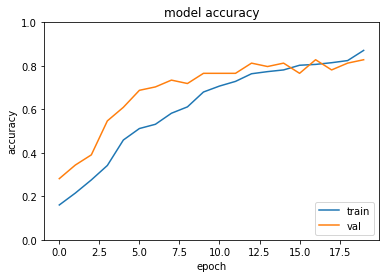

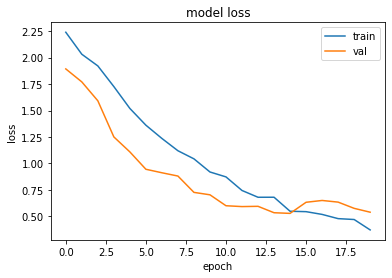

3/3 [==============================] - 1s 247ms/step - loss: 0.8491 - accuracy: 0.8000
Test loss: 0.8491265177726746
Test accuracy: 0.800000011920929
                precision    recall  f1-score   support

           dog       1.00      0.75      0.86         8
       rooster       0.89      1.00      0.94         8
          rain       0.80      0.50      0.62         8
     sea_waves       0.75      0.75      0.75         8
crackling_fire       1.00      0.50      0.67         8
   crying_baby       1.00      0.62      0.77         8
      sneezing       0.67      1.00      0.80         8
    clock_tick       0.62      1.00      0.76         8
    helicopter       0.78      0.88      0.82         8
      chainsaw       0.89      1.00      0.94         8

      accuracy                           0.80        80
     macro avg       0.84      0.80      0.79        80
  weighted avg       0.84      0.80      0.79        80



[]

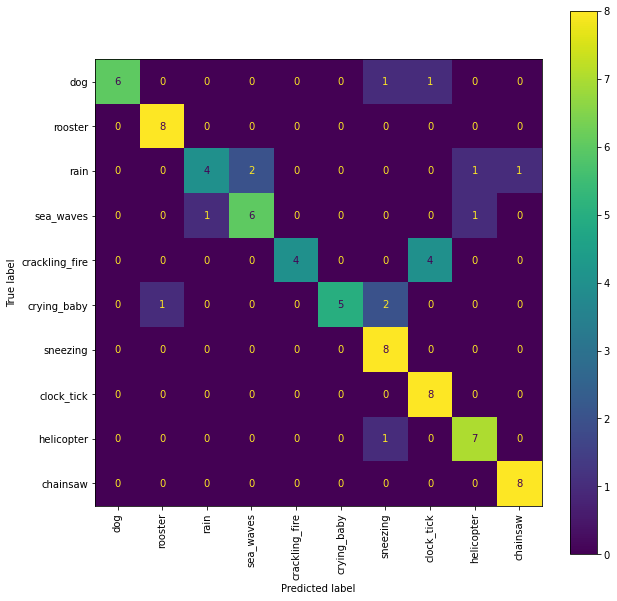

In [101]:
# Load best model
model = tf.keras.models.load_model(checkpoint_path)

# Plot training accuracy history
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.ylim(0,1)
plt.legend(['train', 'val'], loc='lower right')
plt.show()

# Plot training loss history
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.show()

test_loss, test_accuracy = model.evaluate(X_test_std, y_test)

print(f'Test loss: {test_loss}')
print(f'Test accuracy: {test_accuracy}')

y_pred_proba = model.predict(X_test_std)
y_pred_test = np.array([np.argmax(y) for y in y_pred_proba])
y_true_test = np.array([np.argmax(y) for y in y_test])

# Classification Report
print(classification_report(y_true_test, y_pred_test, target_names=label_names))

# Confusion matrix
fig, ax = plt.subplots(figsize=(10,10))
cmp = ConfusionMatrixDisplay.from_predictions(y_true_test, y_pred_test, display_labels=label_names, xticks_rotation='vertical', ax=ax)
plt.plot()

### 2.4. Run multiple experiments
Run a set of experiments with different parameters:
- Feature extraction with Mel spectrogram:
    - Different n_fft, hop_length and n_mels
- Data augmentation:
    - With/without data augmentation (without < with)
    - Different number of augmentated data
    - Different probabilities for augmentations in pipeline
- CNN:
    - Different number of filters and kernel size (256 < 32 < 64 < 128)
    - Different number of last dense layer (50 < 100 < 150)

In [2]:
source_path = Path('../ESC-50-master/ESC-50-master/audio')
metadata_path = os.path.join('../ESC-50-master/ESC-50-master/meta/esc50.csv')
metadata_df = pd.read_csv(metadata_path)
metadata_esc10_df = metadata_df[metadata_df['esc10']]
esc10_files = metadata_esc10_df['filename'].values

In [3]:
def extract_mel_spectrogram(sr, n_fft, hop_length, n_mels):
    
    # Create spectrograms for all ESC-10 files
    preprocessed_data = []

    for file in tqdm(esc10_files):

        # Load file
        file_path = os.path.join(source_path, file)
        signal, sr = librosa.load(file_path, sr=sr)

        # Create Mel Spectrogram and convert to db scale
        mel = librosa.feature.melspectrogram(signal, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
        mel_db = librosa.power_to_db(mel)
        mel_db = mel_db.reshape(1, mel_db.shape[0], mel_db.shape[1])

        # Extract class label from filename
        label_org = int(file.split('-')[-1].split('.')[0])

        # Get new label from label map
        label = label_map[label_org]

        preprocessed_data.append({
            'file': file,
            'label': label,
            'signal': signal,
            'mel_db': mel_db
        })

    preprocessed_data_df = pd.DataFrame(preprocessed_data)
    
    return preprocessed_data_df

In [4]:
def split_data(preprocessed_data_df):
    
    # Spectrogram feature
    X = preprocessed_data_df['mel_db'].values
    X = np.concatenate(X, axis=0)

    n_recs = X.shape[0]
    n_rows = X.shape[1]
    n_cols = X.shape[2]

    X = X.reshape(n_recs, n_rows*n_cols) # Flatten for StandardScaling

    # Target variable
    y = preprocessed_data_df['label'].values
    y = to_categorical(y, num_classes=num_classes)

    # Filenames
    files = preprocessed_data_df['file'].values

    # Train/test split with stratify on y (we want all digits being evenly represented in train and test)
    X_train, X_test, y_train, y_test, files_train, files_test = train_test_split(X, y, files, test_size=0.2, stratify=y, random_state=42)
    
    # Split train set from above in train and valid set, so we have train, valid and test set
    X_train, X_valid, y_train, y_valid, files_train, files_valid = train_test_split(X_train, y_train, files_train, test_size=0.2, stratify=y_train, random_state=42)

    # Fit StandardScaler on training data
    scaler = StandardScaler()
    X_train_std = scaler.fit_transform(X_train)
    X_valid_std = scaler.transform(X_valid)
    X_test_std = scaler.transform(X_test)

    X_train_std = X_train_std.reshape(X_train.shape[0], n_rows, n_cols, 1) # Reshape to 4D - needed for CCN
    X_valid_std = X_valid_std.reshape(X_valid.shape[0], n_rows, n_cols, 1)
    X_test_std = X_test_std.reshape(X_test.shape[0], n_rows, n_cols, 1)

    return X_train_std, X_valid_std, X_test_std, X_train, X_valid, X_test, y_train, y_valid, y_test, files_train

In [5]:
def create_augmented_data(n_augmentation_per_train,
                          p_per_augmentation,
                          X_train,
                          X_valid,
                          X_test,
                          y_train,
                          files_train, 
                          sr, 
                          n_fft, 
                          hop_length, 
                          n_mels):
    
    # Pipeline with all augmentations, whereas every augmentation is performed with p=1.0
    augment = Compose([
        AddGaussianNoise(min_amplitude=0.001, max_amplitude=0.015, p=p_per_augmentation),
        Shift(min_fraction=-1, max_fraction=1, p=p_per_augmentation),
        TimeStretch(min_rate=0.5, max_rate=1.5, p=p_per_augmentation),
        PitchShift(min_semitones=-12, max_semitones=12, p=p_per_augmentation),
        Gain(min_gain_in_db=-10, max_gain_in_db=10, p=p_per_augmentation)
    ])
    
    preprocessed_augmented_data = []

    # Iterate through training files and create an augmented version for each, i.e. double the amount of training data
    for file_train in tqdm(files_train):
        
        # Load file
        file_path = os.path.join(source_path, file_train)
        signal, sr = librosa.load(file_path, sr=sr)
        
        # For each training file, create n_augmentation_per_train augmented file
        for i in range(n_augmentation_per_train):      

            # Augment data
            augmented_signal = augment(samples=signal, sample_rate=sr)

            # Create Mel Spectrogram and convert to db scale
            mel = librosa.feature.melspectrogram(augmented_signal, sr=sr, n_fft=n_fft, hop_length=hop_length, n_mels=n_mels)
            mel_db = librosa.power_to_db(mel)
            mel_db = mel_db.reshape(1, mel_db.shape[0], mel_db.shape[1])

            # Extract class label from file name
            label_org = int(file_train.split('-')[-1].split('.')[0])

            # Get new label from label map
            label = label_map[label_org]

            preprocessed_augmented_data.append({
                'original_file': file_train,
                'label': label,
                'signal': augmented_signal,
                'mel_db': mel_db
            })

    preprocessed_augmented_data_df = pd.DataFrame(preprocessed_augmented_data)
    
    X_aug = preprocessed_augmented_data_df['mel_db'].values
    X_aug = np.concatenate(X_aug, axis=0)

    n_aug_recs = X_aug.shape[0]
    n_aug_rows = X_aug.shape[1]
    n_aug_cols = X_aug.shape[2]

    X_aug = X_aug.reshape(n_aug_recs, n_aug_rows*n_aug_cols) # Flatten for StandardScaling
    X_train_all = np.concatenate([X_aug, X_train], axis=0)
    
    # To categorical of augmented labels and validation labels and concat with original train labels
    y_aug = preprocessed_augmented_data_df['label'].values
    y_aug = to_categorical(y_aug, num_classes=num_classes)
    y_train_all = np.concatenate([y_aug, y_train], axis=0)
       
    # Fit StandardScaler on training data incl. augmented data and transform valid and test set
    scaler = StandardScaler()
    X_train_all_std = scaler.fit_transform(X_train_all)
    X_valid_std = scaler.transform(X_valid)
    X_test_std = scaler.transform(X_test)

    X_train_all_std = X_train_all_std.reshape(X_train_all.shape[0], n_aug_rows, n_aug_cols, 1) # Reshape to 4D - needed for CCN
    X_valid_std = X_valid_std.reshape(X_valid.shape[0], n_aug_rows, n_aug_cols, 1)
    X_test_std = X_test_std.reshape(X_test.shape[0], n_aug_rows, n_aug_cols, 1)
    
    return X_train_all_std, X_valid_std, X_test_std, y_train_all

In [6]:
def build_run_training(experiment_id,
                       repetition_id,
                       X_train_std,
                       X_valid_std,
                       X_test_std,
                       y_train,
                       y_valid,
                       y_test,
                       n_filters_l1, 
                       n_filters_l2, 
                       n_filters_l3, 
                       n_dense_layer,
                       batch_size,
                       epochs):
    
    n_rows = X_train_std.shape[1]
    n_cols = X_train_std.shape[2]
    
    # Build and train CNN
    model = Sequential([
        Conv2D(filters=n_filters_l1, kernel_size=10, strides=2, padding='same', activation='relu', input_shape=(n_rows, n_cols, 1)),
        MaxPool2D(pool_size=2, strides=2, padding='same'),
        Conv2D(filters=n_filters_l2, kernel_size=10, strides=2, padding='same', activation='relu'),
        MaxPool2D(pool_size=2, strides=2, padding='same'),
        Conv2D(filters=n_filters_l3, kernel_size=5, strides=2, padding='same', activation='relu'),
        MaxPool2D(pool_size=2, strides=2, padding='same'),
        Flatten(),
        Dropout(0.5),
        Dense(units=n_dense_layer, activation='relu'),
        Dense(units=num_classes, activation='softmax')
    ])

    # Model checkpoint to save best model
    checkpoint_path = f'models/best_model_esc10_exp_{experiment_id}_{repetition_id}'
    checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_accuracy', verbose=2, save_best_only=True, mode='max')

    #early_stopping = EarlyStopping(monitor='val_loss', patience=5)

    # Compile the model with adam optimizer and default settings
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    # Fit
    history = model.fit(X_train_std, y_train, epochs=epochs, validation_data=(X_valid_std, y_valid), batch_size=batch_size, callbacks=[checkpoint], verbose=0)
    
    # Load best model
    model = tf.keras.models.load_model(checkpoint_path)
    
    # Test
    test_loss, test_accuracy = model.evaluate(X_test_std, y_test, verbose=0)
    
    return history, test_accuracy

In [8]:
# Define some constants
num_classes = 10 # For ESC10
n_repetitions = 10 # Number of repetitions for same experiment

# Remap original labels for ESC10 data
label_map = {
    0: 0,  # dog
    1: 1,  # rooster
    10: 2, # rain
    11: 3, # sea_waves
    12: 4, # crackling_fire
    20: 5, # crying_baby
    21: 6, # sneezing
    38: 7, # clock_tick
    40: 8, # helicopter
    41: 9  # chainsaw
}

label_names = [
    'dog',
    'rooster',
    'rain',
    'sea_waves',
    'crackling_fire',
    'crying_baby',
    'sneezing',
    'clock_tick',
    'helicopter',
    'chainsaw'
]

# Define different augmentation setups, i.e. number of augmentation per training dataset and p per augmentation
feature_extraction_setups = [
    {
        'sr': 44100,
        'n_fft': 2048,
        'hop_length': 512,
        'n_mels': 128
    }
    ,
    {
        'sr': 8000,
        'n_fft': 512,
        'hop_length': 35,
        'n_mels': 64
    }
]

augmentation_setups = [
    {
        'n_augmentation_per_train': 0, # No augmentation
        'p_per_augmentation': 0.0
    },
    {
        'n_augmentation_per_train': 1,
        'p_per_augmentation': 0.5
    },
    {
        'n_augmentation_per_train': 5,
        'p_per_augmentation': 0.5
    }
]

cnn_setups = [
    {
        'n_filters_l1': 64,
        'n_filters_l2': 32,
        'n_filters_l3': 32,
        'n_dense_layer': 150,
        'batch_size': 64,
        'epochs': 20
    }
    ,
    {
        'n_filters_l1': 128,
        'n_filters_l2': 64,
        'n_filters_l3': 64,
        'n_dense_layer': 150,
        'batch_size': 64,
        'epochs': 20
    }
]

In [ ]:
%%time

# Loop through feature extraction setups
experiment_id = 0

experiment_results = []

for feature_extraction in feature_extraction_setups:
    
    print(feature_extraction)
    sr = feature_extraction['sr']
    n_fft = feature_extraction['n_fft']
    hop_length = feature_extraction['hop_length']
    n_mels = feature_extraction['n_mels']
    
    # Extract features
    preprocessed_data_df = extract_mel_spectrogram(sr, n_fft, hop_length, n_mels)
    
    # Create train/test split
    X_train_std_org, X_valid_std_org, X_test_std_org, X_train_org, X_valid_org, X_test_org, y_train_org, y_valid_org, y_test_org, files_train = split_data(preprocessed_data_df)
    print('Shape before augmentation: ', X_train_std_org.shape, X_valid_std_org.shape, X_test_std_org.shape)

    # Loop through augmentation setups
    for augmentation in augmentation_setups:
        
        print(augmentation)
        n_augmentation_per_train = augmentation['n_augmentation_per_train']
        p_per_augmentation = augmentation['p_per_augmentation']
        
        if n_augmentation_per_train != 0:
        
            X_train_std, X_valid_std, X_test_std, y_train = create_augmented_data(n_augmentation_per_train,
                                                                                  p_per_augmentation,
                                                                                  X_train_org,
                                                                                  X_valid_org,
                                                                                  X_test_org,
                                                                                  y_train_org,
                                                                                  files_train, 
                                                                                  sr, 
                                                                                  n_fft, 
                                                                                  hop_length, 
                                                                                  n_mels)

        else:
            
            X_train_std = X_train_std_org
            X_valid_std = X_valid_std_org
            X_test_std = X_test_std_org
            y_train = y_train_org
            
        print('Shape after augmentation: ', X_train_std.shape, y_train.shape, X_valid_std.shape, X_test_std.shape)
        
        # Loop trough CNN setups
        for cnn in cnn_setups:
            
            print(cnn)
            n_filters_l1 = cnn['n_filters_l1']
            n_filters_l2 = cnn['n_filters_l2']
            n_filters_l3 = cnn['n_filters_l3']
            n_dense_layer = cnn['n_dense_layer']
            batch_size = cnn['batch_size']
            epochs = cnn['epochs']  
            
            for repetition_id in range(n_repetitions):
            
                history, test_accuracy = build_run_training(experiment_id,
                                                            repetition_id,
                                                            X_train_std,
                                                            X_valid_std,
                                                            X_test_std,
                                                            y_train,
                                                            y_valid_org,
                                                            y_test_org,
                                                            n_filters_l1, 
                                                            n_filters_l2, 
                                                            n_filters_l3, 
                                                            n_dense_layer,
                                                            batch_size,
                                                            epochs)

                print('Test accuracy: ', test_accuracy)
            
                # Add everything to experiment results
                experiment_results.append({
                    'experiment_id': experiment_id,
                    'repetition_id': repetition_id,
                    'sr': sr,
                    'n_fft': n_fft,
                    'hop_length': hop_length,
                    'n_mels': n_mels,
                    'n_augmentation_per_train': n_augmentation_per_train,
                    'p_per_augmentation': p_per_augmentation,
                    'n_filters_l1': n_filters_l1,
                    'n_filters_l2': n_filters_l2,
                    'n_filters_l3': n_filters_l3,
                    'n_dense_layer': n_dense_layer,
                    'batch_size': batch_size,
                    'epochs': epochs,
                    'history_accuracy': history.history['accuracy'],
                    'history_val_accuracy': history.history['val_accuracy'],
                    'test_accuracy': test_accuracy
                })
            
            experiment_id += 1
            
experiment_results_df = pd.DataFrame(experiment_results)
experiment_results_df.head()

{'sr': 44100, 'n_fft': 2048, 'hop_length': 512, 'n_mels': 128}


100%|██████████| 400/400 [00:06<00:00, 58.96it/s]


Shape before augmentation:  (256, 128, 431, 1) (64, 128, 431, 1) (80, 128, 431, 1)
{'n_augmentation_per_train': 0, 'p_per_augmentation': 0.0}
Shape after augmentation:  (256, 128, 431, 1) (256, 10) (64, 128, 431, 1) (80, 128, 431, 1)
{'n_filters_l1': 64, 'n_filters_l2': 32, 'n_filters_l3': 32, 'n_dense_layer': 150, 'batch_size': 64, 'epochs': 20}

Epoch 00001: val_accuracy improved from -inf to 0.37500, saving model to models\best_model_esc10_exp_0_0
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_0_0\assets

Epoch 00002: val_accuracy improved from 0.37500 to 0.43750, saving model to models\best_model_esc10_exp_0_0
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_0_0\assets

Epoch 00003: val_accuracy did not improve from 0.43750

Epoch 00004: val_accuracy improved from 0.43750 to 0.59375, saving model to models\best_model_esc10_exp_0_0
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_0_0\assets

Epoch 00005: val_accuracy did not improve from 0


Epoch 00008: val_accuracy did not improve from 0.60938

Epoch 00009: val_accuracy improved from 0.60938 to 0.65625, saving model to models\best_model_esc10_exp_0_3
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_0_3\assets

Epoch 00010: val_accuracy improved from 0.65625 to 0.68750, saving model to models\best_model_esc10_exp_0_3
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_0_3\assets

Epoch 00011: val_accuracy improved from 0.68750 to 0.70312, saving model to models\best_model_esc10_exp_0_3
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_0_3\assets

Epoch 00012: val_accuracy improved from 0.70312 to 0.73438, saving model to models\best_model_esc10_exp_0_3
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_0_3\assets

Epoch 00013: val_accuracy improved from 0.73438 to 0.75000, saving model to models\best_model_esc10_exp_0_3
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_0_3\assets

Epoch 00014: val_accuracy im

INFO:tensorflow:Assets written to: models\best_model_esc10_exp_0_6\assets

Epoch 00015: val_accuracy did not improve from 0.73438

Epoch 00016: val_accuracy did not improve from 0.73438

Epoch 00017: val_accuracy did not improve from 0.73438

Epoch 00018: val_accuracy improved from 0.73438 to 0.76562, saving model to models\best_model_esc10_exp_0_6
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_0_6\assets

Epoch 00019: val_accuracy improved from 0.76562 to 0.78125, saving model to models\best_model_esc10_exp_0_6
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_0_6\assets

Epoch 00020: val_accuracy improved from 0.78125 to 0.79688, saving model to models\best_model_esc10_exp_0_6
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_0_6\assets
Test accuracy:  0.7875000238418579

Epoch 00001: val_accuracy improved from -inf to 0.23438, saving model to models\best_model_esc10_exp_0_7
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_0_7\a

INFO:tensorflow:Assets written to: models\best_model_esc10_exp_1_0\assets

Epoch 00003: val_accuracy did not improve from 0.35938

Epoch 00004: val_accuracy improved from 0.35938 to 0.53125, saving model to models\best_model_esc10_exp_1_0
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_1_0\assets

Epoch 00005: val_accuracy improved from 0.53125 to 0.59375, saving model to models\best_model_esc10_exp_1_0
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_1_0\assets

Epoch 00006: val_accuracy did not improve from 0.59375

Epoch 00007: val_accuracy improved from 0.59375 to 0.67188, saving model to models\best_model_esc10_exp_1_0
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_1_0\assets

Epoch 00008: val_accuracy improved from 0.67188 to 0.70312, saving model to models\best_model_esc10_exp_1_0
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_1_0\assets

Epoch 00009: val_accuracy did not improve from 0.70312

Epoch 00010: val_accuracy


Epoch 00008: val_accuracy improved from 0.70312 to 0.75000, saving model to models\best_model_esc10_exp_1_3
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_1_3\assets

Epoch 00009: val_accuracy did not improve from 0.75000

Epoch 00010: val_accuracy did not improve from 0.75000

Epoch 00011: val_accuracy improved from 0.75000 to 0.79688, saving model to models\best_model_esc10_exp_1_3
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_1_3\assets

Epoch 00012: val_accuracy did not improve from 0.79688

Epoch 00013: val_accuracy did not improve from 0.79688

Epoch 00014: val_accuracy did not improve from 0.79688

Epoch 00015: val_accuracy did not improve from 0.79688

Epoch 00016: val_accuracy did not improve from 0.79688

Epoch 00017: val_accuracy improved from 0.79688 to 0.81250, saving model to models\best_model_esc10_exp_1_3
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_1_3\assets

Epoch 00018: val_accuracy did not improve from 0.81250

Ep


Epoch 00019: val_accuracy did not improve from 0.79688

Epoch 00020: val_accuracy improved from 0.79688 to 0.81250, saving model to models\best_model_esc10_exp_1_6
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_1_6\assets
Test accuracy:  0.7124999761581421

Epoch 00001: val_accuracy improved from -inf to 0.15625, saving model to models\best_model_esc10_exp_1_7
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_1_7\assets

Epoch 00002: val_accuracy improved from 0.15625 to 0.26562, saving model to models\best_model_esc10_exp_1_7
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_1_7\assets

Epoch 00003: val_accuracy improved from 0.26562 to 0.40625, saving model to models\best_model_esc10_exp_1_7
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_1_7\assets

Epoch 00004: val_accuracy improved from 0.40625 to 0.62500, saving model to models\best_model_esc10_exp_1_7
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_1_7\asse

100%|██████████| 256/256 [01:09<00:00,  3.67it/s]


Shape after augmentation:  (512, 128, 431, 1) (512, 10) (64, 128, 431, 1) (80, 128, 431, 1)
{'n_filters_l1': 64, 'n_filters_l2': 32, 'n_filters_l3': 32, 'n_dense_layer': 150, 'batch_size': 64, 'epochs': 20}

Epoch 00001: val_accuracy improved from -inf to 0.28125, saving model to models\best_model_esc10_exp_2_0
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_2_0\assets

Epoch 00002: val_accuracy improved from 0.28125 to 0.37500, saving model to models\best_model_esc10_exp_2_0
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_2_0\assets

Epoch 00003: val_accuracy improved from 0.37500 to 0.51562, saving model to models\best_model_esc10_exp_2_0
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_2_0\assets

Epoch 00004: val_accuracy improved from 0.51562 to 0.56250, saving model to models\best_model_esc10_exp_2_0
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_2_0\assets

Epoch 00005: val_accuracy improved from 0.56250 to 0.57812, sav


Epoch 00014: val_accuracy improved from 0.76562 to 0.79688, saving model to models\best_model_esc10_exp_2_3
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_2_3\assets

Epoch 00015: val_accuracy improved from 0.79688 to 0.85938, saving model to models\best_model_esc10_exp_2_3
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_2_3\assets

Epoch 00016: val_accuracy improved from 0.85938 to 0.90625, saving model to models\best_model_esc10_exp_2_3
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_2_3\assets

Epoch 00017: val_accuracy did not improve from 0.90625

Epoch 00018: val_accuracy did not improve from 0.90625

Epoch 00019: val_accuracy did not improve from 0.90625

Epoch 00020: val_accuracy did not improve from 0.90625
Test accuracy:  0.8374999761581421

Epoch 00001: val_accuracy improved from -inf to 0.31250, saving model to models\best_model_esc10_exp_2_4
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_2_4\assets

Epoch 00002


Epoch 00002: val_accuracy improved from 0.29688 to 0.37500, saving model to models\best_model_esc10_exp_2_7
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_2_7\assets

Epoch 00003: val_accuracy improved from 0.37500 to 0.51562, saving model to models\best_model_esc10_exp_2_7
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_2_7\assets

Epoch 00004: val_accuracy improved from 0.51562 to 0.53125, saving model to models\best_model_esc10_exp_2_7
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_2_7\assets

Epoch 00005: val_accuracy improved from 0.53125 to 0.60938, saving model to models\best_model_esc10_exp_2_7
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_2_7\assets

Epoch 00006: val_accuracy improved from 0.60938 to 0.71875, saving model to models\best_model_esc10_exp_2_7
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_2_7\assets

Epoch 00007: val_accuracy did not improve from 0.71875

Epoch 00008: val_accuracy im

INFO:tensorflow:Assets written to: models\best_model_esc10_exp_3_0\assets

Epoch 00017: val_accuracy did not improve from 0.82812

Epoch 00018: val_accuracy improved from 0.82812 to 0.84375, saving model to models\best_model_esc10_exp_3_0
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_3_0\assets

Epoch 00019: val_accuracy did not improve from 0.84375

Epoch 00020: val_accuracy did not improve from 0.84375
Test accuracy:  0.800000011920929

Epoch 00001: val_accuracy improved from -inf to 0.34375, saving model to models\best_model_esc10_exp_3_1
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_3_1\assets

Epoch 00002: val_accuracy improved from 0.34375 to 0.42188, saving model to models\best_model_esc10_exp_3_1
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_3_1\assets

Epoch 00003: val_accuracy improved from 0.42188 to 0.57812, saving model to models\best_model_esc10_exp_3_1
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_3_1\as


Epoch 00010: val_accuracy did not improve from 0.78125

Epoch 00011: val_accuracy improved from 0.78125 to 0.79688, saving model to models\best_model_esc10_exp_3_4
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_3_4\assets

Epoch 00012: val_accuracy did not improve from 0.79688

Epoch 00013: val_accuracy did not improve from 0.79688

Epoch 00014: val_accuracy did not improve from 0.79688

Epoch 00015: val_accuracy did not improve from 0.79688

Epoch 00016: val_accuracy improved from 0.79688 to 0.82812, saving model to models\best_model_esc10_exp_3_4
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_3_4\assets

Epoch 00017: val_accuracy did not improve from 0.82812

Epoch 00018: val_accuracy did not improve from 0.82812

Epoch 00019: val_accuracy did not improve from 0.82812

Epoch 00020: val_accuracy did not improve from 0.82812
Test accuracy:  0.8500000238418579

Epoch 00001: val_accuracy improved from -inf to 0.26562, saving model to models\best_model_esc


Epoch 00005: val_accuracy improved from 0.62500 to 0.68750, saving model to models\best_model_esc10_exp_3_8
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_3_8\assets

Epoch 00006: val_accuracy did not improve from 0.68750

Epoch 00007: val_accuracy did not improve from 0.68750

Epoch 00008: val_accuracy improved from 0.68750 to 0.73438, saving model to models\best_model_esc10_exp_3_8
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_3_8\assets

Epoch 00009: val_accuracy did not improve from 0.73438

Epoch 00010: val_accuracy improved from 0.73438 to 0.81250, saving model to models\best_model_esc10_exp_3_8
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_3_8\assets

Epoch 00011: val_accuracy did not improve from 0.81250

Epoch 00012: val_accuracy did not improve from 0.81250

Epoch 00013: val_accuracy did not improve from 0.81250

Epoch 00014: val_accuracy did not improve from 0.81250

Epoch 00015: val_accuracy did not improve from 0.81250

Ep

100%|██████████| 256/256 [05:44<00:00,  1.35s/it]


Shape after augmentation:  (1536, 128, 431, 1) (1536, 10) (64, 128, 431, 1) (80, 128, 431, 1)
{'n_filters_l1': 64, 'n_filters_l2': 32, 'n_filters_l3': 32, 'n_dense_layer': 150, 'batch_size': 64, 'epochs': 20}

Epoch 00001: val_accuracy improved from -inf to 0.45312, saving model to models\best_model_esc10_exp_4_0
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_4_0\assets

Epoch 00002: val_accuracy improved from 0.45312 to 0.67188, saving model to models\best_model_esc10_exp_4_0
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_4_0\assets

Epoch 00003: val_accuracy did not improve from 0.67188

Epoch 00004: val_accuracy improved from 0.67188 to 0.75000, saving model to models\best_model_esc10_exp_4_0
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_4_0\assets

Epoch 00005: val_accuracy improved from 0.75000 to 0.79688, saving model to models\best_model_esc10_exp_4_0
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_4_0\assets

Epoch


Epoch 00019: val_accuracy did not improve from 0.89062

Epoch 00020: val_accuracy did not improve from 0.89062
Test accuracy:  0.875

Epoch 00001: val_accuracy improved from -inf to 0.35938, saving model to models\best_model_esc10_exp_4_4
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_4_4\assets

Epoch 00002: val_accuracy improved from 0.35938 to 0.60938, saving model to models\best_model_esc10_exp_4_4
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_4_4\assets

Epoch 00003: val_accuracy improved from 0.60938 to 0.70312, saving model to models\best_model_esc10_exp_4_4
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_4_4\assets

Epoch 00004: val_accuracy improved from 0.70312 to 0.76562, saving model to models\best_model_esc10_exp_4_4
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_4_4\assets

Epoch 00005: val_accuracy did not improve from 0.76562

Epoch 00006: val_accuracy improved from 0.76562 to 0.82812, saving model to mode

INFO:tensorflow:Assets written to: models\best_model_esc10_exp_4_8\assets

Epoch 00004: val_accuracy improved from 0.68750 to 0.78125, saving model to models\best_model_esc10_exp_4_8
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_4_8\assets

Epoch 00005: val_accuracy improved from 0.78125 to 0.79688, saving model to models\best_model_esc10_exp_4_8
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_4_8\assets

Epoch 00006: val_accuracy did not improve from 0.79688

Epoch 00007: val_accuracy did not improve from 0.79688

Epoch 00008: val_accuracy did not improve from 0.79688

Epoch 00009: val_accuracy did not improve from 0.79688

Epoch 00010: val_accuracy improved from 0.79688 to 0.81250, saving model to models\best_model_esc10_exp_4_8
INFO:tensorflow:Assets written to: models\best_model_esc10_exp_4_8\assets

Epoch 00011: val_accuracy did not improve from 0.81250

Epoch 00012: val_accuracy improved from 0.81250 to 0.84375, saving model to models\best_model_es

In [10]:
experiment_results_df.groupby('experiment_id')['test_accuracy'].mean()

experiment_id
0    0.76500
1    0.81250
2    0.88125
Name: test_accuracy, dtype: float64

In [11]:
experiment_results_df.to_pickle('experiment_results_df.pkl')

In [14]:
np.save('X_test_std', X_test_std)

In [16]:
np.save('y_test', y_test_org)

In [19]:
experiment_results_df.sort_values(by='test_accuracy', ascending=False)

,experiment_id,repetition_id,sr,n_fft,hop_length,n_mels,n_augmentation_per_train,p_per_augmentation,n_filters_l1,n_filters_l2,n_filters_l3,n_dense_layer,batch_size,epochs,history_accuracy,history_val_accuracy,test_accuracy
28,2,8,44100,2048,512,128,5,0.5,64,32,32,150,64,20,"[0.2109375, 0.4036458432674408, 0.539713561534...","[0.390625, 0.671875, 0.8125, 0.703125, 0.8125,...",0.9125
27,2,7,44100,2048,512,128,5,0.5,64,32,32,150,64,20,"[0.1822916716337204, 0.3880208432674408, 0.529...","[0.484375, 0.625, 0.640625, 0.84375, 0.8125, 0...",0.9125
26,2,6,44100,2048,512,128,5,0.5,64,32,32,150,64,20,"[0.177734375, 0.3483072817325592, 0.474609375,...","[0.265625, 0.484375, 0.625, 0.78125, 0.78125, ...",0.9125
21,2,1,44100,2048,512,128,5,0.5,64,32,32,150,64,20,"[0.23828125, 0.4251302182674408, 0.56901043653...","[0.4375, 0.734375, 0.828125, 0.75, 0.8125, 0.8...",0.8875
20,2,0,44100,2048,512,128,5,0.5,64,32,32,150,64,20,"[0.1744791716337204, 0.3346354067325592, 0.469...","[0.421875, 0.515625, 0.609375, 0.734375, 0.734...",0.8875
24,2,4,44100,2048,512,128,5,0.5,64,32,32,150,64,20,"[0.2135416716337204, 0.42578125, 0.52278643846...","[0.421875, 0.703125, 0.734375, 0.765625, 0.765...",0.8750
22,2,2,44100,2048,512,128,5,0.5,64,32,32,150,64,20,"[0.2174479216337204, 0.4453125, 0.572265625, 0...","[0.5625, 0.734375, 0.71875, 0.75, 0.703125, 0....",0.8750
11,1,1,44100,2048,512,128,1,0.5,64,32,32,150,64,20,"[0.171875, 0.26171875, 0.36328125, 0.4140625, ...","[0.28125, 0.4375, 0.609375, 0.671875, 0.6875, ...",0.8750
23,2,3,44100,2048,512,128,5,0.5,64,32,32,150,64,20,"[0.2220052033662796, 0.3919270932674408, 0.524...","[0.453125, 0.65625, 0.71875, 0.71875, 0.796875...",0.8625
25,2,5,44100,2048,512,128,5,0.5,64,32,32,150,64,20,"[0.22265625, 0.4069010317325592, 0.5625, 0.624...","[0.5, 0.703125, 0.65625, 0.703125, 0.78125, 0....",0.8500


## References
- https://towardsdatascience.com/preprocess-audio-data-with-the-signal-envelope-499e6072108
- https://github.com/soerenab/AudioMNIST/blob/master/preprocess_data.py
- https://www.researchgate.net/publication/347356900_Audio_Pre-Processing_For_Deep_Learning - > see file:///C:/Users/marti/Downloads/APPFDL.pdf
- https://towardsdatascience.com/understanding-audio-data-fourier-transform-fft-spectrogram-and-speech-recognition-a4072d228520
- https://dropsofai.com/sound-wave-basics-every-data-scientist-must-know-before-starting-analysis-on-audio-data/
- https://www.section.io/engineering-education/machine-learning-for-audio-classification/#differences-between-sound-and-audio
- https://www.kdnuggets.com/2020/02/audio-data-analysis-deep-learning-python-part-1.html
- https://medium.com/analytics-vidhya/simplifying-audio-data-fft-stft-mfcc-for-machine-learning-and-deep-learning-443a2f962e0e
- https://medium.com/gradientcrescent/urban-sound-classification-using-convolutional-neural-networks-with-keras-theory-and-486e92785df4
- https://towardsdatascience.com/audio-classification-using-fastai-and-on-the-fly-frequency-transforms-4dbe1b540f89
- https://medium.com/analytics-vidhya/understanding-the-mel-spectrogram-fca2afa2ce53
- https://blog.paperspace.com/introduction-to-audio-analysis-and-synthesis/
- https://www.youtube.com/watch?v=m3XbqfIij_Y (Basics Audio Processing)
- https://www.youtube.com/watch?v=Oa_d-zaUti8 (Preprocessing Audio for Deep Learning)
- https://www.youtube.com/watch?v=szyGiObZymo (Music Genre Classification)
- https://www.tutorialexample.com/understand-n_fft-hop_length-win_length-in-audio-processing-librosa-tutorial/ (hop_lenght, n_fft_, win_length)
- https://towardsdatascience.com/audio-deep-learning-made-simple-sound-classification-step-by-step-cebc936bbe5
- https://colab.research.google.com/github/enzokro/clck10/blob/master/_notebooks/2020-09-10-Normalizing-spectrograms-for-deep-learning.ipynb (Normalize spectrograms)
- https://towardsdatascience.com/audio-deep-learning-made-simple-part-3-data-preparation-and-augmentation-24c6e1f6b52
- https://medium.com/analytics-vidhya/simplifying-audio-data-fft-stft-mfcc-for-machine-learning-and-deep-learning-443a2f962e0e (STFT, MFCC, FFT)
- https://www.nti-audio.com/en/support/know-how/fast-fourier-transform-fft#:~:text=The%20sampling%20rate%20or%20sampling,2%5E10%20%3D%201024%20samples) (FFT parameters)
- https://towardsdatascience.com/all-you-need-to-know-to-start-speech-processing-with-deep-learning-102c916edf62 (Basics)